In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import numpy as np
from sklearn import metrics
from sklearn.metrics import confusion_matrix

In [12]:
data=pd.read_excel('./dataset_new_v2.xlsx')
dataOrig=pd.read_excel('./dataset_new_v2.xlsx')

# EDA

In [13]:
data.head()

,Age,HGB(adj.),HGB,MCH,MCHC,MCV,HCT,RBC,Mhgb,Mhct,...,Mahz,Mzhda,Mb12,Mmahz,Mmzhda,Mmb12,Sex,RDW,PLT/mm3,TLC
0,28,96,9.6,17.0,28.2,60.1,0.340,5.66,1.0,0.5000,...,0.10,0.0,0.000000,0,0,0,0,20.0,128.3,11.10
1,41,138,13.8,28.9,31.0,93.1,0.445,4.78,0.0,0.0000,...,1.00,0.0,0.033333,0,0,0,0,13.0,419.0,7.02
2,40,134,13.4,28.8,32.2,89.5,0.416,4.65,0.0,0.0000,...,0.00,1.0,0.440000,0,0,0,1,13.0,325.0,8.09
3,76,113,11.3,26.7,30.8,86.6,0.367,4.24,1.0,0.1625,...,0.75,0.0,0.613333,0,0,0,0,14.9,264.0,13.41
4,20,115,11.5,27.8,31.2,89.1,0.369,4.14,1.0,0.1375,...,0.80,0.0,0.000000,0,0,0,1,13.2,196.0,4.75


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 338 entries, 0 to 337
Data columns (total 39 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Age        338 non-null    int64  
 1   HGB(adj.)  338 non-null    int64  
 2   HGB        338 non-null    float64
 3   MCH        338 non-null    float64
 4   MCHC       338 non-null    float64
 5   MCV        338 non-null    float64
 6   HCT        338 non-null    float64
 7   RBC        338 non-null    float64
 8   Mhgb       338 non-null    float64
 9   Mhct       338 non-null    float64
 10  Mmchc      338 non-null    float64
 11  Mmch       338 non-null    float64
 12  Mmcv       338 non-null    float64
 13  Mrbc       338 non-null    float64
 14  siM        338 non-null    float64
 15  Res        338 non-null    int64  
 16  Result     338 non-null    int64  
 17  MCV_micro  338 non-null    float64
 18  MCV_macro  338 non-null    float64
 19  MCH_micro  338 non-null    float64
 20  MCH_macro 

In [15]:
data

,Age,HGB(adj.),HGB,MCH,MCHC,MCV,HCT,RBC,Mhgb,Mhct,...,Mahz,Mzhda,Mb12,Mmahz,Mmzhda,Mmb12,Sex,RDW,PLT/mm3,TLC
0,28,96,9.6,17.0,28.2,60.1,0.340,5.66,1.0,0.5000,...,0.10,0.00,0.000000,0,0,0,0,20.0,128.3,11.10
1,41,138,13.8,28.9,31.0,93.1,0.445,4.78,0.0,0.0000,...,1.00,0.00,0.033333,0,0,0,0,13.0,419.0,7.02
2,40,134,13.4,28.8,32.2,89.5,0.416,4.65,0.0,0.0000,...,0.00,1.00,0.440000,0,0,0,1,13.0,325.0,8.09
3,76,113,11.3,26.7,30.8,86.6,0.367,4.24,1.0,0.1625,...,0.75,0.00,0.613333,0,0,0,0,14.9,264.0,13.41
4,20,115,11.5,27.8,31.2,89.1,0.369,4.14,1.0,0.1375,...,0.80,0.00,0.000000,0,0,0,1,13.2,196.0,4.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
333,22,95,9.5,20.4,32.6,62.6,0.291,4.65,1.0,1.0000,...,0.00,0.10,0.000000,0,0,0,0,17.0,200.0,6.70
334,51,150,15.0,31.0,33.8,91.7,0.352,4.85,0.0,0.3500,...,0.00,0.70,0.000000,0,0,0,0,13.3,215.0,5.60
335,21,131,13.1,29.3,33.0,88.7,0.397,4.47,0.0,0.0000,...,0.00,0.65,0.696667,0,0,0,1,13.5,329.0,9.20
336,35,132,13.2,27.9,32.1,86.7,0.362,4.75,0.0,0.2250,...,0.50,0.00,0.973333,0,0,0,1,13.5,174.0,6.48


In [16]:
to_drop = [
  'HGB(adj.)',
  'Mhgb',
  'Mhct',
  'Mmchc',
  'Mmch',
  'Mmcv',
  'Mrbc',
  'siM',
  'MCV_micro',
  'MCV_macro',
  'MCH_micro',
  'MCH_macro',
  'Mmicro',
  'Mmacro',
  'Mnorm',
  'Mahz',
  'Mzhda',
  'Mb12',
  'MCH',
  'MCHC',
  'MCV',
  'Res'
]

data.drop(columns=to_drop, axis=1,inplace=True)

In [17]:
data

,Age,HGB,HCT,RBC,Result,Microcyt,Macrocyt,Normal,Fer,B12,Mmahz,Mmzhda,Mmb12,Sex,RDW,PLT/mm3,TLC
0,28,9.6,0.340,5.66,1,1,0,1,42,403,0,0,0,0,20.0,128.3,11.10
1,41,13.8,0.445,4.78,0,0,0,0,62,390,0,0,0,0,13.0,419.0,7.02
2,40,13.4,0.416,4.65,0,0,0,0,17,268,0,0,0,1,13.0,325.0,8.09
3,76,11.3,0.367,4.24,1,0,0,0,55,216,0,0,0,0,14.9,264.0,13.41
4,20,11.5,0.369,4.14,0,0,0,0,56,456,0,0,0,1,13.2,196.0,4.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
333,22,9.5,0.291,4.65,1,1,0,1,38,416,0,0,0,0,17.0,200.0,6.70
334,51,15.0,0.352,4.85,1,0,0,0,26,407,0,0,0,0,13.3,215.0,5.60
335,21,13.1,0.397,4.47,0,0,0,0,27,191,0,0,0,1,13.5,329.0,9.20
336,35,13.2,0.362,4.75,0,0,0,0,50,108,0,0,0,1,13.5,174.0,6.48


C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_8172\3011792269.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data, x='Result',ax=ax[1], palette=['#1f77b4', '#ff7f0e'])
C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_8172\3011792269.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_xticklabels(['No Anemia', 'Anemia'], fontsize=12)


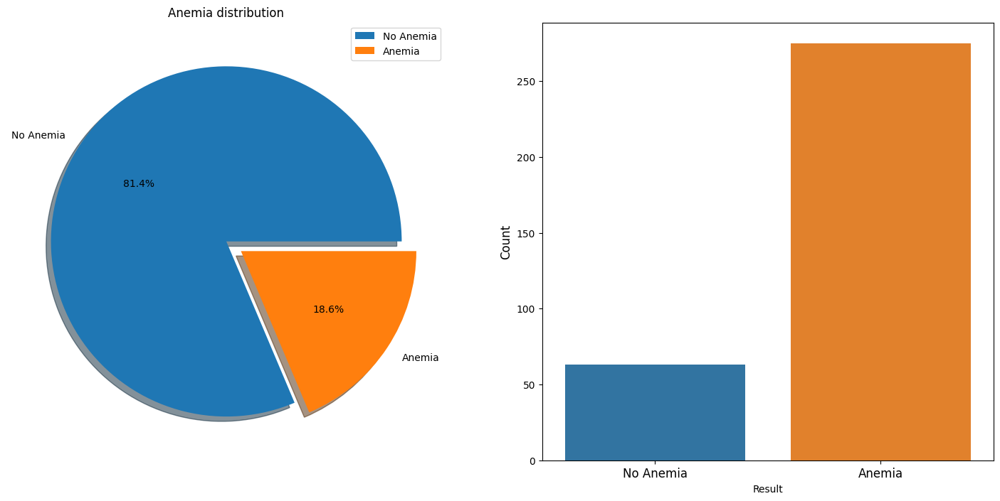

In [18]:
f,ax=plt.subplots(1,2,figsize=(18,8))
data['Result'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',ax=ax[0],shadow=True, labels=['No Anemia', 'Anemia'])
# ax[0].set_title('0 - No Anemia\n1 - Anemia')
ax[0].set_title('Anemia distribution')
ax[0].set_ylabel('')
sns.countplot(data=data, x='Result',ax=ax[1], palette=['#1f77b4', '#ff7f0e'])
# ax[1].set_title('had anemia')

ax[0].legend(['No Anemia', 'Anemia'], loc="upper right")
ax[1].set_ylabel('Count', fontsize=12)

ax[1].set_xticklabels(['No Anemia', 'Anemia'], fontsize=12)

plt.show()

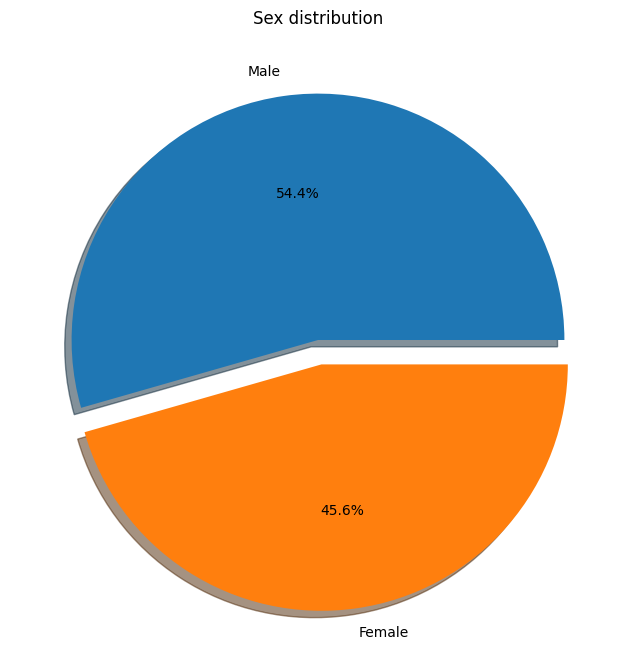

In [19]:
f,ax=plt.subplots(1,1,figsize=(18,8))
data['Sex'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',ax=ax,shadow=True, labels=['Male', 'Female'])
ax.set_title('Sex distribution')
ax.set_ylabel('')
plt.show()

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_8172\243662207.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[1].set_xticklabels(['Male', 'Female'], fontsize=12)


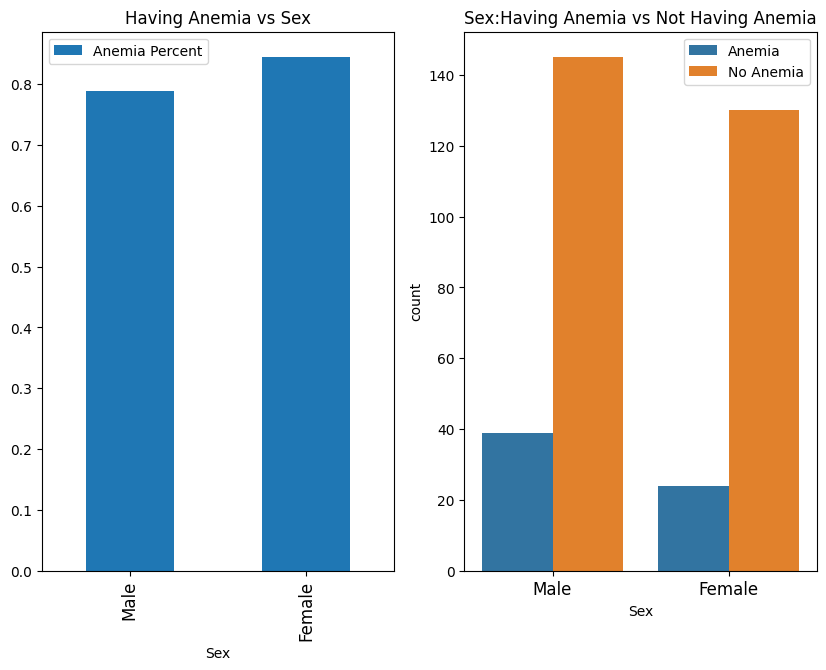

In [20]:
f,ax=plt.subplots(1,2,figsize=(10,7))
data[['Sex','Result']].groupby(['Sex']).mean().plot.bar(ax=ax[0])
ax[0].set_title('Having Anemia vs Sex')
sns.countplot(x='Sex',hue='Result',data=data,ax=ax[1])
ax[1].set_title('Sex:Having Anemia vs Not Having Anemia')

ax[0].set_xticklabels(['Male', 'Female'], fontsize=12)
ax[1].set_xticklabels(['Male', 'Female'], fontsize=12)

ax[0].legend(['Anemia Percent'])
ax[1].legend(['Anemia', 'No Anemia'])

plt.show()

In [21]:
# for i in range(2,6):
#   sns.displot(data.iloc[:,i:i+1], kde=True, bins=15)

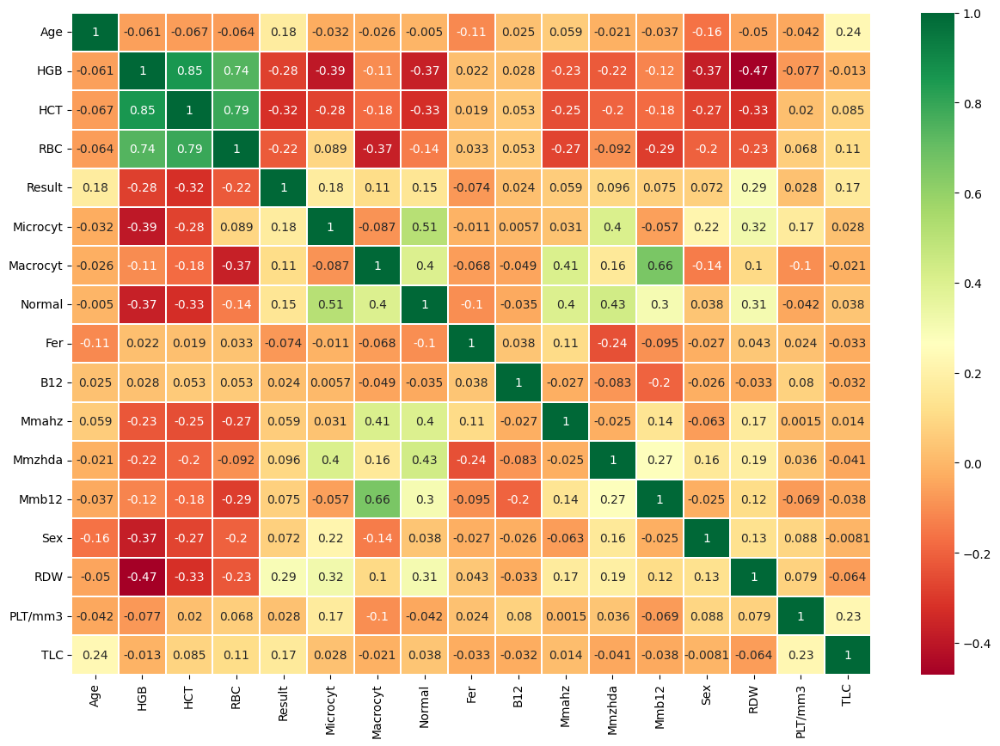

In [22]:
sns.heatmap(data.corr(),annot=True,cmap='RdYlGn',linewidths=0.2)
fig=plt.gcf()
fig.set_size_inches(15,10)
plt.show()

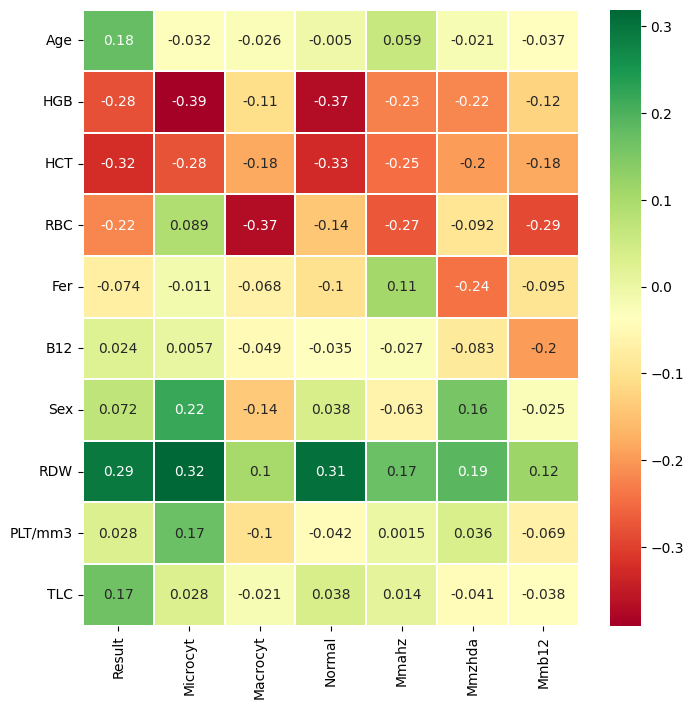

In [23]:
corr=data.corr().drop(['Age', 'Sex', 'RBC', 'HCT', 'Fer', 'B12', 'RDW', 'TLC',
       'PLT/mm3', 'HGB'],axis=1)
corr=corr.drop(["Result",'Microcyt', 'Macrocyt', 'Normal', 'Mmahz', 'Mmzhda', 'Mmb12'],axis=0)

sns.heatmap(corr,annot=True,cmap='RdYlGn',linewidths=0.2)
fig=plt.gcf()
fig.set_size_inches(8,8)
plt.show()

In [24]:
from sklearn.model_selection import train_test_split
Y_arr = ['Result', 'Microcyt', 'Macrocyt','Normal', 'Mmahz','Mmzhda','Mmb12']
X = np.array(data.drop(Y_arr, axis=1).astype(float))
Y = np.array(data.loc[:,Y_arr]).astype(float)

In [25]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.2)

# Base ML

In [26]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

In [27]:
def eval_models(models):
  cv_mean=np.zeros((len(models),7))
  std=np.zeros((len(models),7))

  accuracy=np.zeros((len(models),7))
  precision=np.zeros((len(models),7))
  recall=np.zeros((len(models),7))
  f1_arr=np.zeros((len(models),7))
  kfold = KFold(n_splits=10)
  for m in range(len(models)):
    for i in [0,1,2,3,4,5]:
      Y_cur = Y[:,i]
      Y_test_cur = Y_test[:,i]
      model = models[m]
      model.fit(X,Y_cur)
      cv_result = cross_val_score(model,X,Y_cur, cv = kfold, scoring = "accuracy")
      cv_result=cv_result
      y_pred = model.predict(X_test)

      acc = accuracy_score(Y_test_cur, y_pred)
      prec = precision_score(Y_test_cur, y_pred, average='macro', zero_division=0)
      rec = recall_score(Y_test_cur, y_pred, average='macro')
      f1 = f1_score(Y_test_cur, y_pred, average='macro')

      cv_mean[m,i]=(cv_result.mean())
      std[m,i]=(cv_result.std())

      accuracy[m,i]=acc
      precision[m,i]=prec
      recall[m,i]=rec
      f1_arr[m,i]=f1
  return [cv_mean, std, accuracy, precision, recall, f1_arr]


models=[svm.SVC(kernel='linear'),svm.SVC(kernel='rbf'),LogisticRegression(),KNeighborsClassifier(n_neighbors=9),DecisionTreeClassifier(),GaussianNB(),RandomForestClassifier(n_estimators=100)]
classifiers=['Linear Svm','Radial Svm','Logistic Regression','KNN','Decision Tree','Naive Bayes','Random Forest']

results = eval_models(models)


c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l

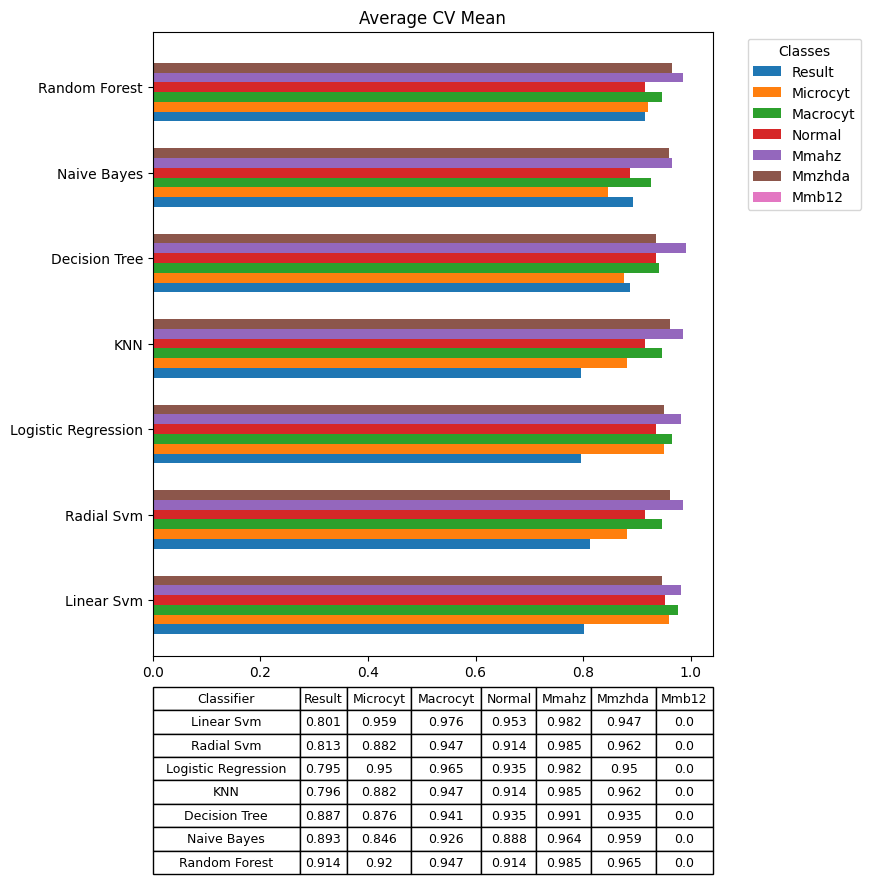

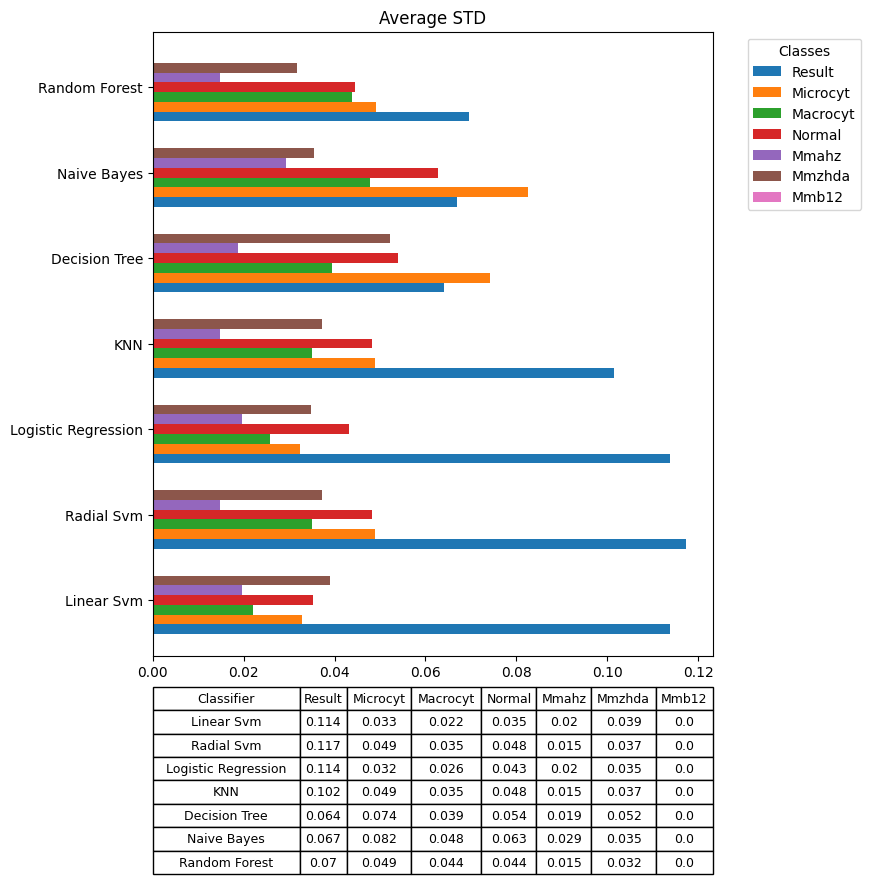

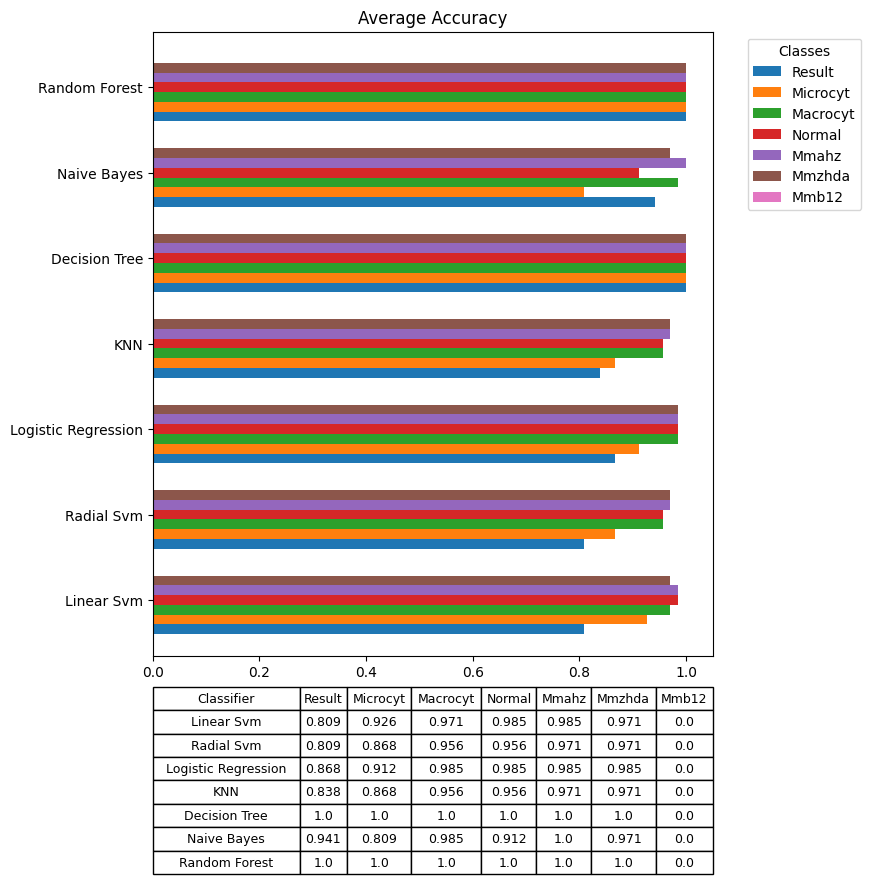

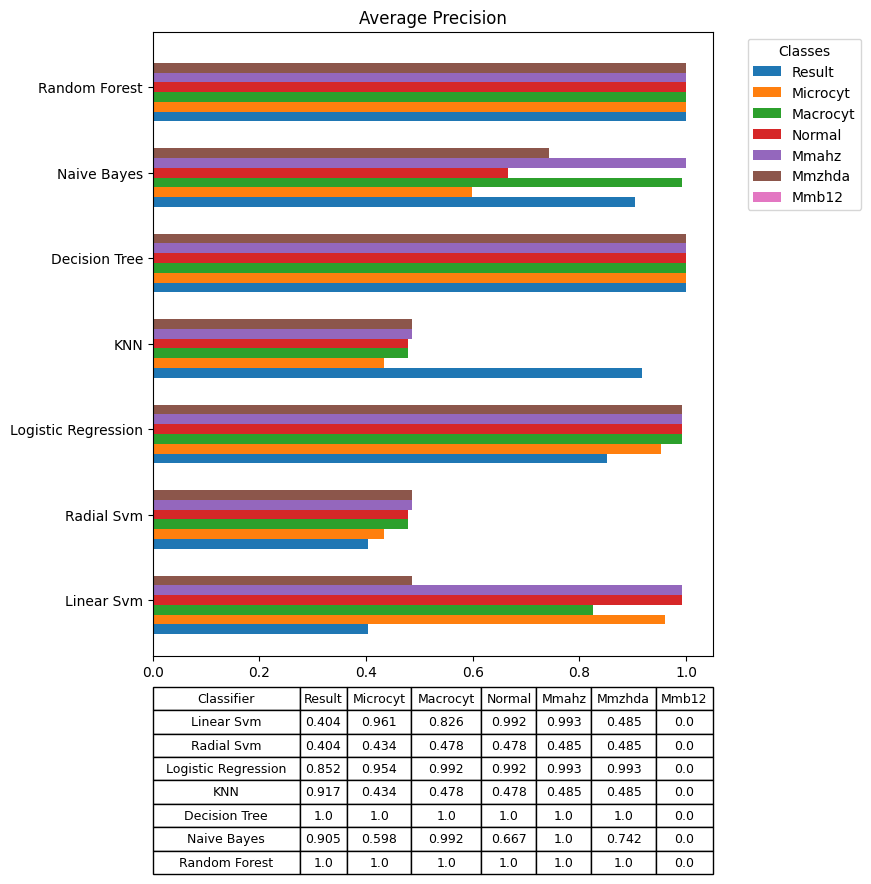

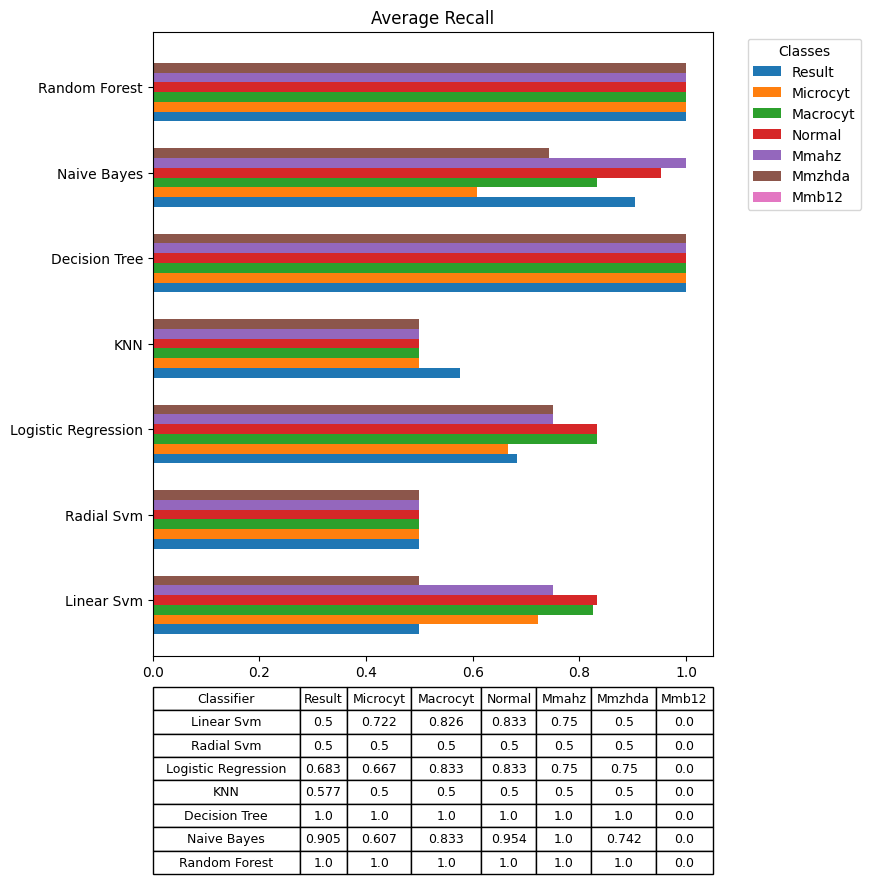

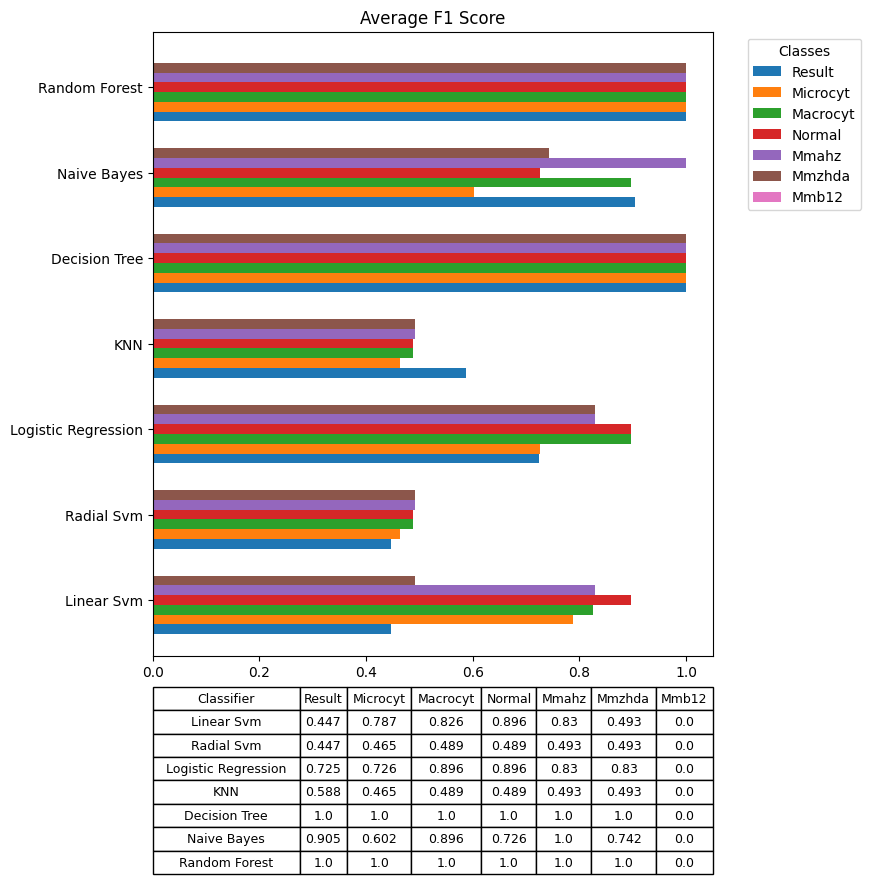

In [28]:
def plot_stats(results, classifiers):
  metrics_cols = ['CV Mean', 'STD', 'Accuracy', 'Precision', 'Recall', 'F1 Score']
  target_cols=['Result', 'Microcyt', 'Macrocyt','Normal', 'Mmahz','Mmzhda','Mmb12']
  for i in range(len(results)):
    df_models=pd.DataFrame(results[i],index=classifiers, columns=target_cols)

    fig, ax = plt.subplots(figsize=(10, 6))
    fig.set_size_inches(8,8)
    df_models.plot.barh(width=0.8, ax=ax)
    plt.title('Average ' + metrics_cols[i])
    ax.legend(title="Classes", bbox_to_anchor=(1.05, 1), loc='upper left')

    table_data = df_models.round(3).reset_index().values 
    column_labels = ["Classifier"] + target_cols
    table = ax.table(cellText=table_data, colLabels=column_labels, cellLoc='center', loc='bottom', bbox=[0, -0.35, 1, 0.3])
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.auto_set_column_width([i for i in range(len(column_labels))])

    plt.subplots_adjust(left=0.2, bottom=0.1)
    plt.show()

plot_stats(results, classifiers)

In [19]:
# np.mean(df_models.drop(['Mmb12'], axis=1), axis=1)

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

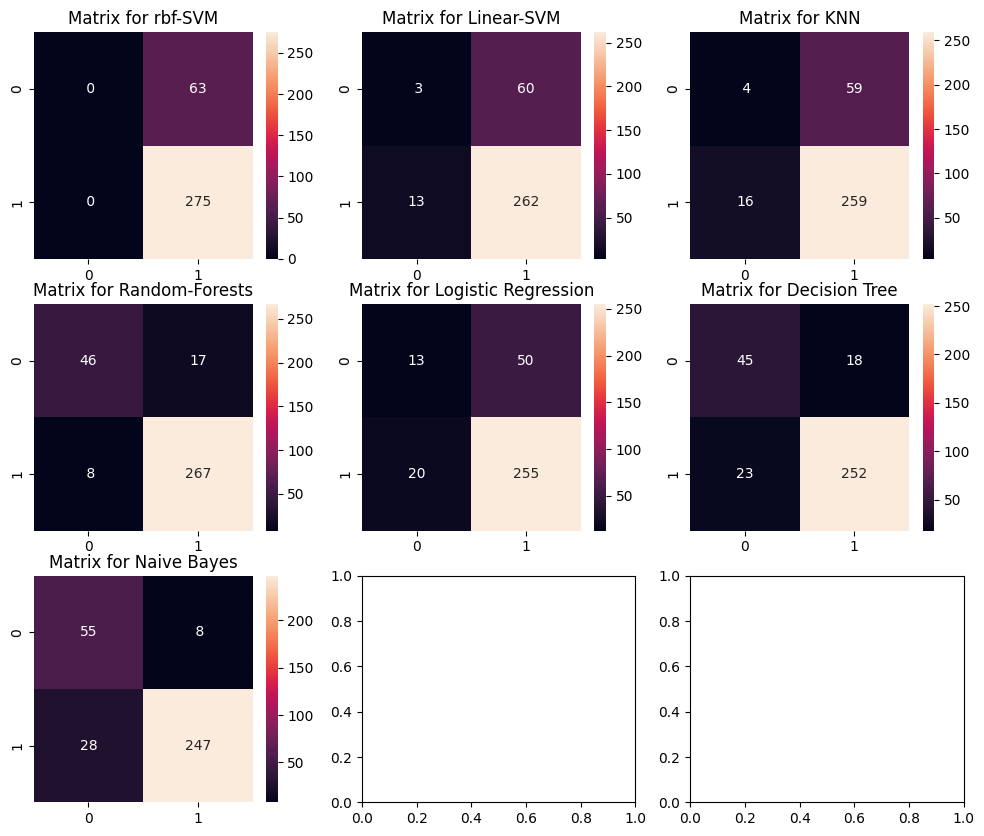

In [20]:
f,ax=plt.subplots(3,3,figsize=(12,10))
Y_cur = Y[:,0]
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=5),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
plt.show()

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

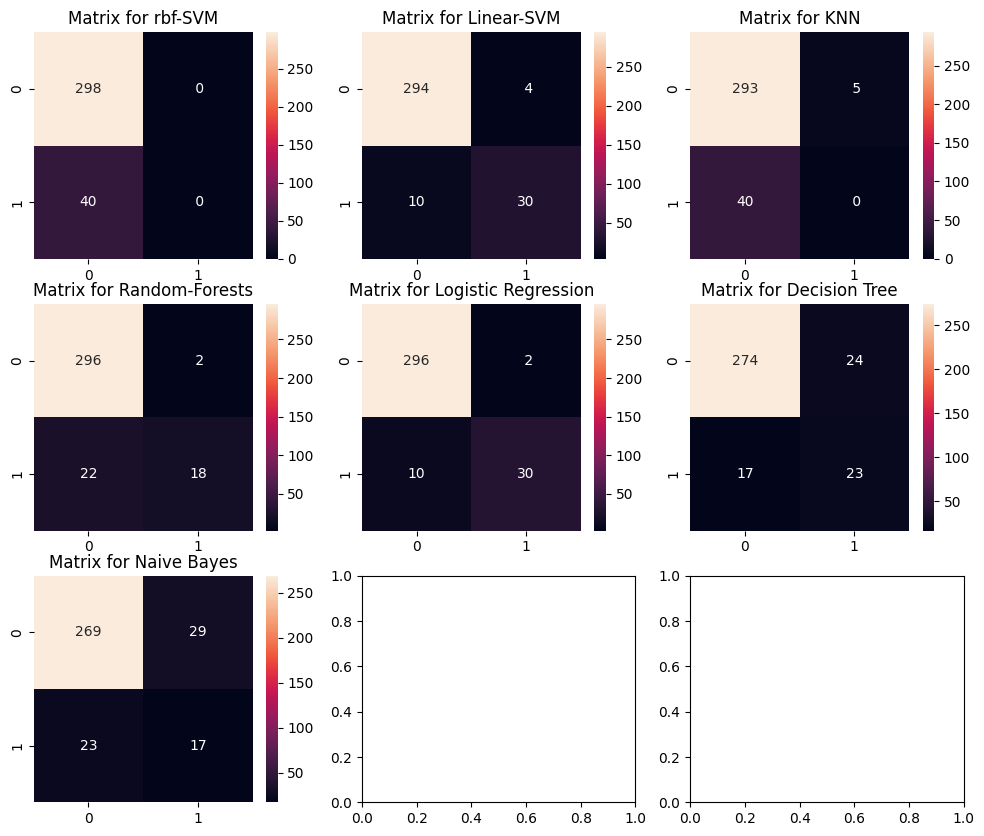

In [21]:
f,ax=plt.subplots(3,3,figsize=(12,10))
Y_cur = Y[:,1]
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=5),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
plt.show()

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

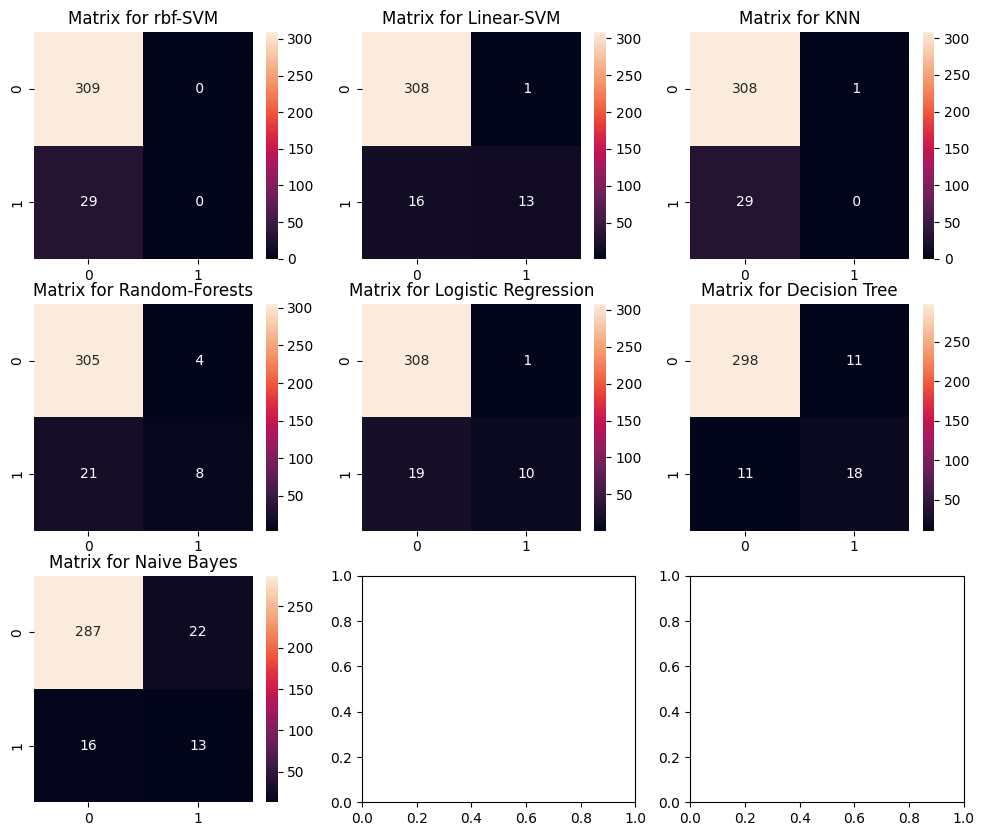

In [22]:
f,ax=plt.subplots(3,3,figsize=(12,10))
Y_cur = Y[:,3]
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=5),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
plt.show()

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_split.py:805: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=10.
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_split.py:805: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=10.
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_split.py:805: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=10.
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_split.py:805: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=10.
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_split.py:805: UserWarning: The least populated class in y has 

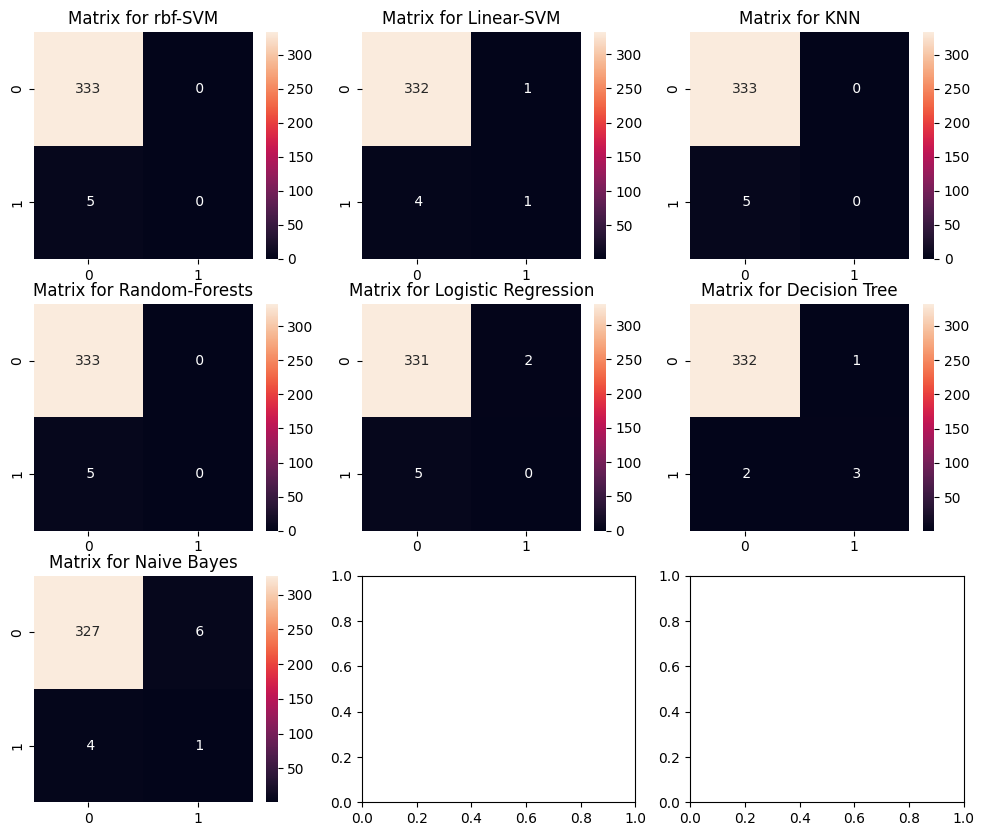

In [23]:
f,ax=plt.subplots(3,3,figsize=(12,10))
Y_cur = Y[:,4]
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=5),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
plt.show()

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

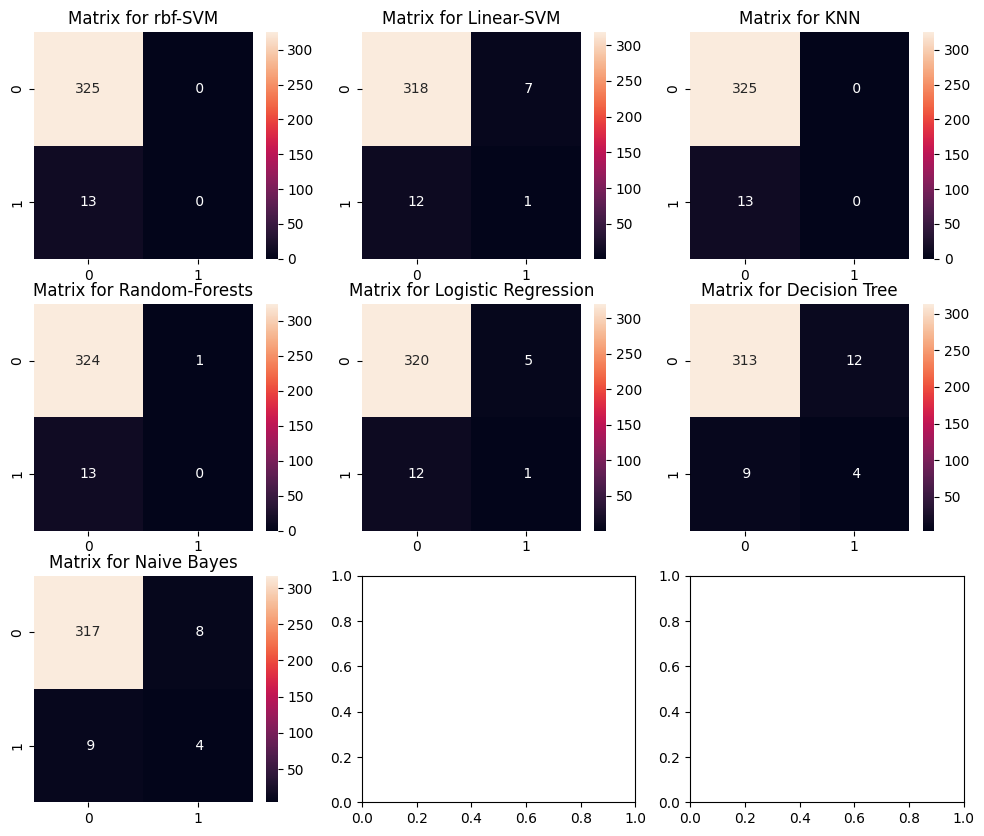

In [24]:
f,ax=plt.subplots(3,3,figsize=(12,10))
Y_cur = Y[:,5]
y_pred = cross_val_predict(svm.SVC(kernel='rbf'),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,0],annot=True,fmt='2.0f')
ax[0,0].set_title('Matrix for rbf-SVM')
y_pred = cross_val_predict(svm.SVC(kernel='linear'),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,1],annot=True,fmt='2.0f')
ax[0,1].set_title('Matrix for Linear-SVM')
y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=5),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[0,2],annot=True,fmt='2.0f')
ax[0,2].set_title('Matrix for KNN')
y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,0],annot=True,fmt='2.0f')
ax[1,0].set_title('Matrix for Random-Forests')
y_pred = cross_val_predict(LogisticRegression(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,1],annot=True,fmt='2.0f')
ax[1,1].set_title('Matrix for Logistic Regression')
y_pred = cross_val_predict(DecisionTreeClassifier(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[1,2],annot=True,fmt='2.0f')
ax[1,2].set_title('Matrix for Decision Tree')
y_pred = cross_val_predict(GaussianNB(),X,Y_cur,cv=10)
sns.heatmap(confusion_matrix(Y_cur,y_pred),ax=ax[2,0],annot=True,fmt='2.0f')
ax[2,0].set_title('Matrix for Naive Bayes')
plt.subplots_adjust(hspace=0.2,wspace=0.2)
plt.show()

In [25]:
# k = 5
# num_val_samples = len(X) // k
# num_epochs = 30
# all_scores = []
# common_history = []
# for i in range(k):
#     data = []
#     print('processing fold #', i)
#     val_data = X[i * num_val_samples: (i + 1) * num_val_samples]
#     val_targets = Y[i * num_val_samples: (i + 1) * num_val_samples]

#     partial_train_data = np.concatenate([X[:i * num_val_samples], X[(i + 1) * num_val_samples:]],axis=0)
#     partial_train_targets = np.concatenate([Y[:i * num_val_samples], Y[(i + 1) * num_val_samples:]], axis=0)

#     model = LogisticRegression()
#     hist = model.fit(partial_train_data,partial_train_targets)
#     prediction=model.predict(val_data)
#     acc = metrics.accuracy_score(prediction, val_targets)
#     print('Fold', i, 'accuracy:', acc, '%')
#     all_scores.append(acc)
# print(np.mean(all_scores))

In [26]:
# model.predict([[0, 10.8, 16.8, 30.6, 79.6, 0.298, 4.186]])[0] # Пример из датасета - должен вывести единицу (анемия)

In [27]:
# f,ax=plt.subplots(1,1,figsize=(12,10))
# y_pred = cross_val_predict(model,X,Y,cv=10)
# sns.heatmap(confusion_matrix(Y,y_pred),ax=ax,annot=True,fmt='2.0f')
# ax.set_title('Matrix for Logistic Regression')
# plt.show()

# Medical algorithm

In [28]:
# sns.set_theme(font_scale=2.5)

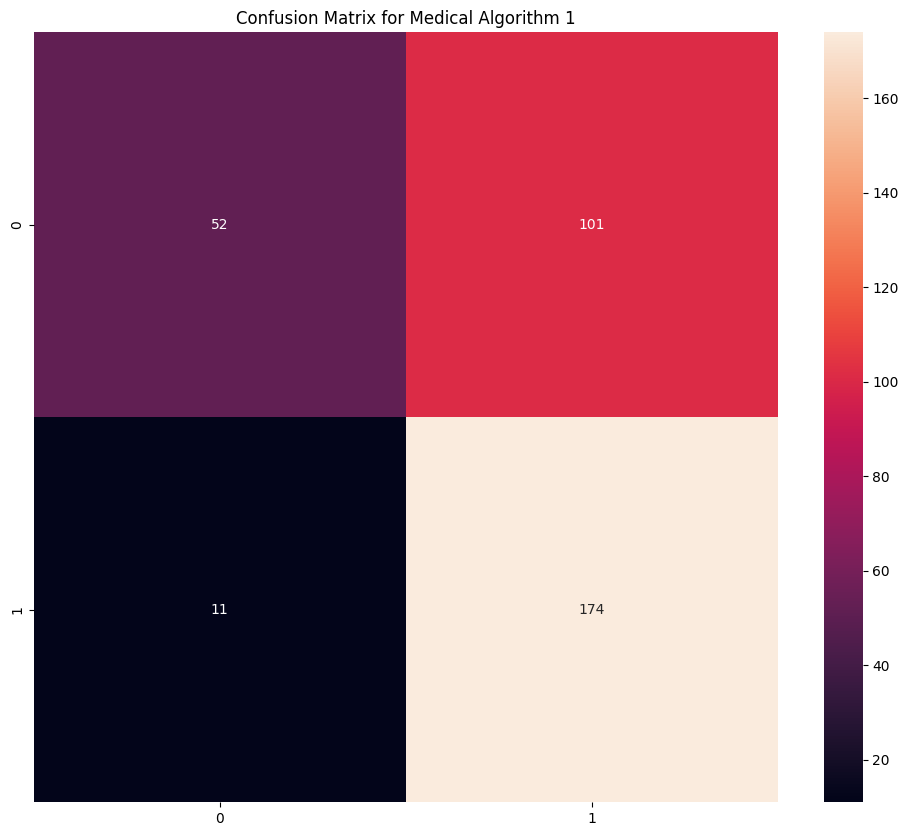

In [ ]:
f,ax=plt.subplots(1,1,figsize=(12,10))
sns.heatmap(confusion_matrix(dataOrig['Res'],dataOrig['Result']),ax=ax,annot=True,fmt='2.0f', fon)
ax.set_title('Confusion Matrix for Medical Algorithm 1')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

# sns.set_theme(font_scale=1)

In [30]:
1-abs(np.sum(np.abs(dataOrig['Res'] - dataOrig['Result']))/len(dataOrig))

np.float64(0.6686390532544378)

# Ensembling
## Boosting

Обучение + оценка всех моделей (3) - 8 секунд

In [31]:
import xgboost as xgb
import lightgbm as lgb
from sklearn.ensemble import AdaBoostClassifier


models=[xgb.XGBClassifier(), AdaBoostClassifier(), lgb.LGBMClassifier()]
classifiers=['XGBoost','AdaBoost','LGBMClassifier']

results_bst = eval_models(models)


[LightGBM] [Info] Number of positive: 275, number of negative: 63
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 707
[LightGBM] [Info] Number of data points in the train set: 338, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.813609 -> initscore=1.473636
[LightGBM] [Info] Start training from score 1.473636
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMCla

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMCla

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMCla

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMCla

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMCla

[LightGBM] [Info] Number of positive: 5, number of negative: 299
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 304, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.016447 -> initscore=-4.091006
[LightGBM] [Info] Start training from score -4.091006
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMCla

[LightGBM] [Info] Number of positive: 10, number of negative: 294
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 660
[LightGBM] [Info] Number of data points in the train set: 304, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.032895 -> initscore=-3.380995
[LightGBM] [Info] Start training from score -3.380995
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMCla

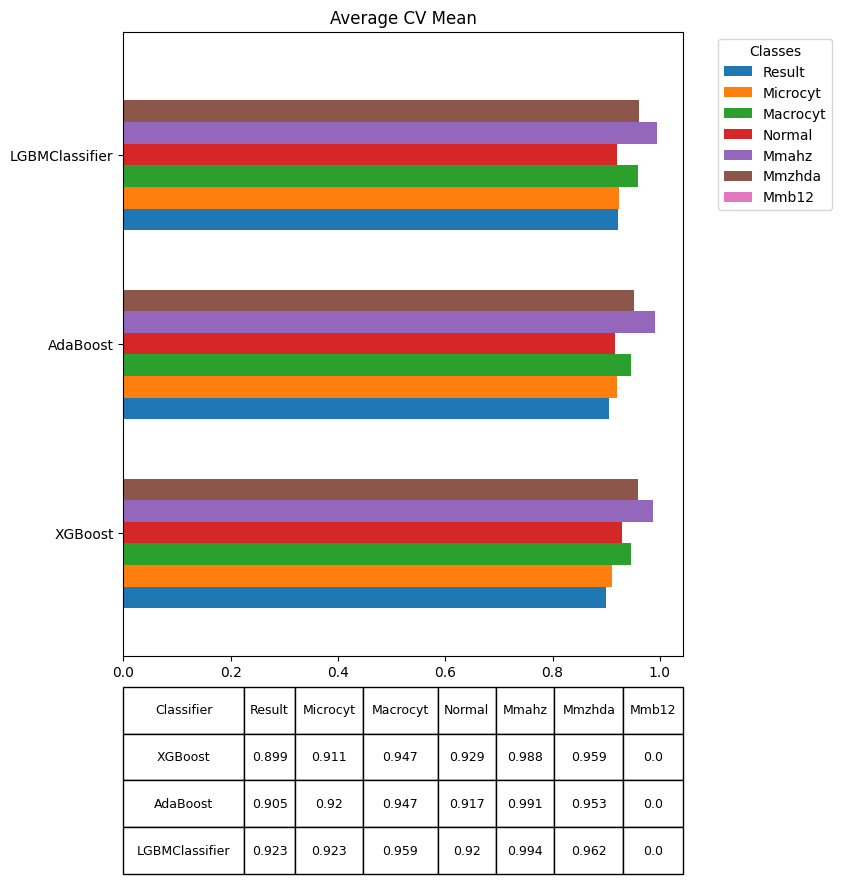

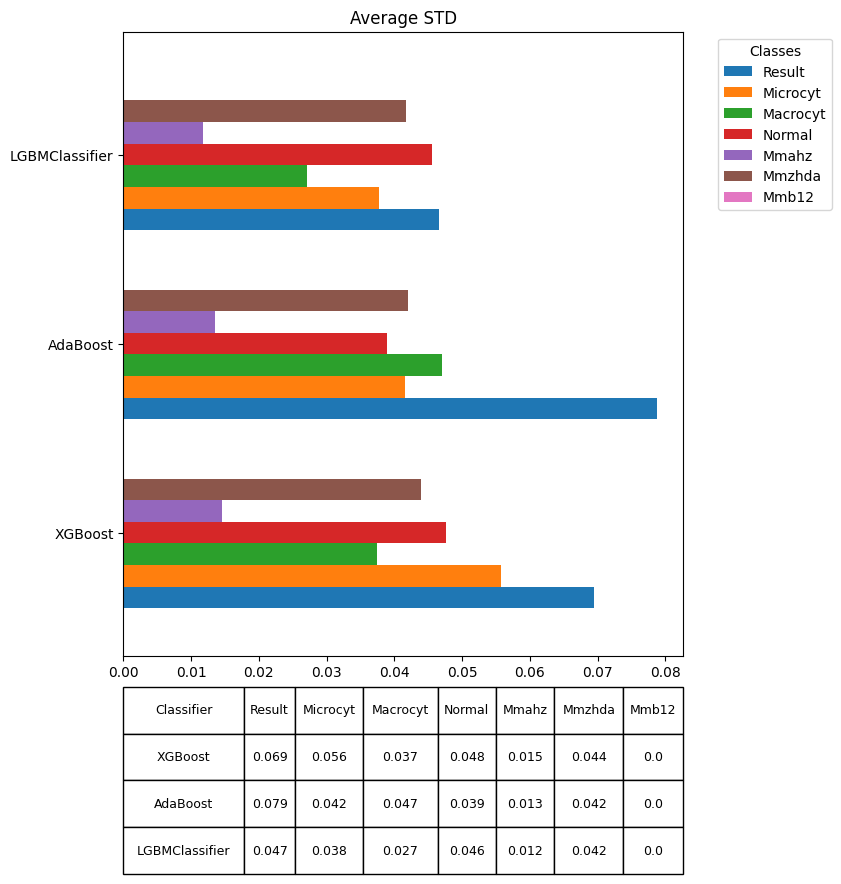

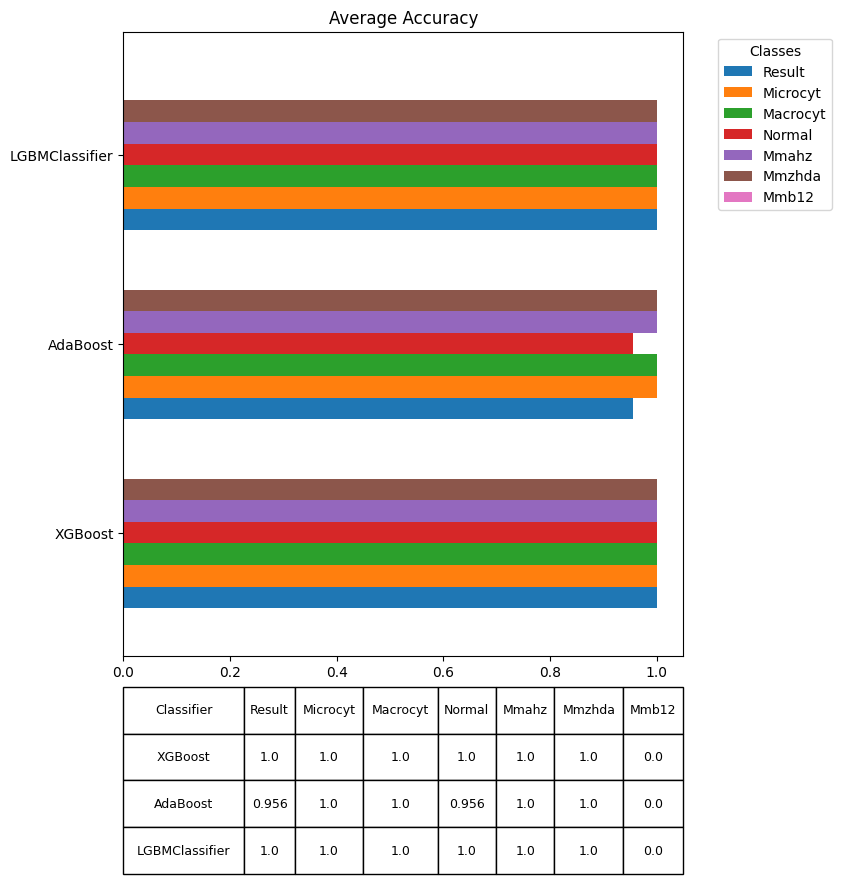

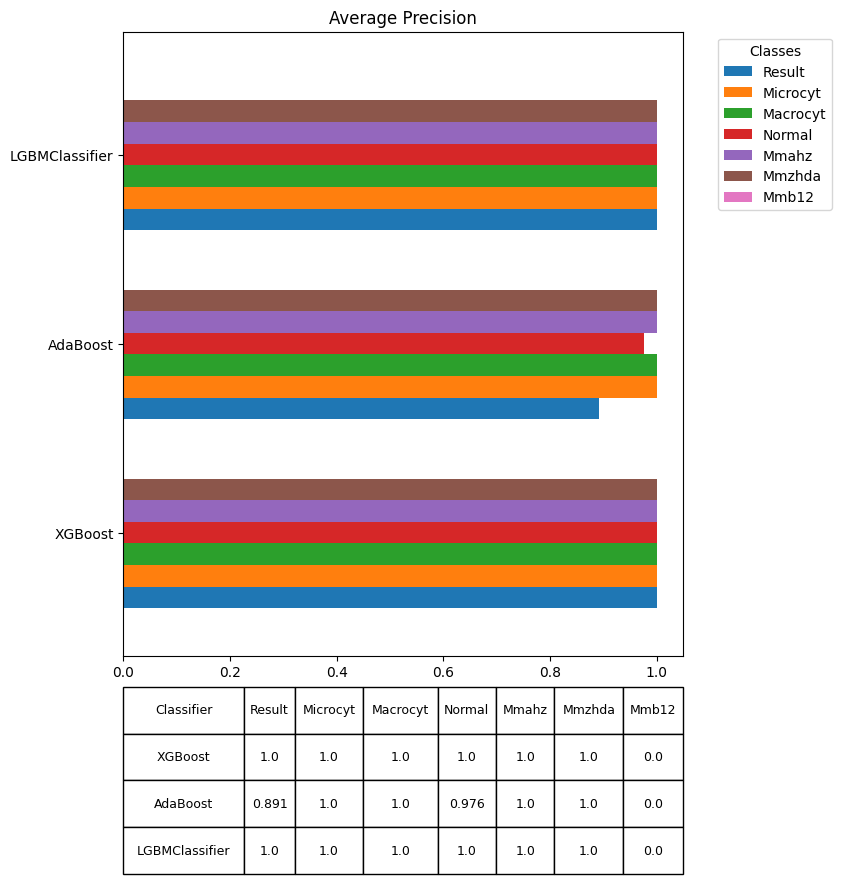

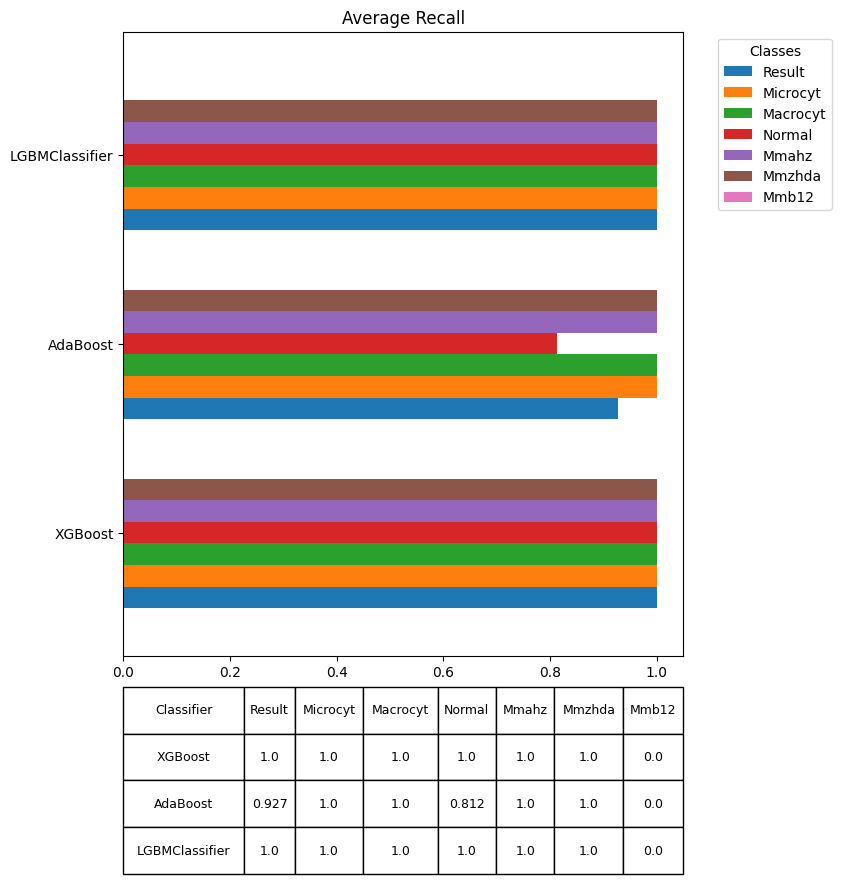

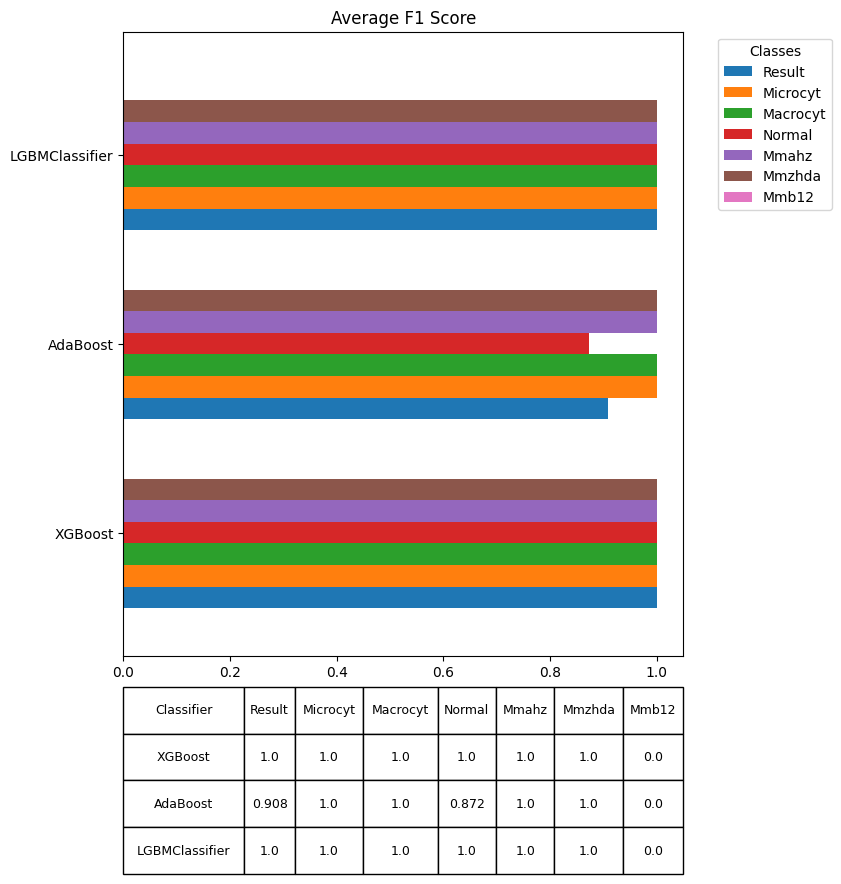

In [32]:
plot_stats(results_bst, classifiers)

## Bagging

Обучение + оценка всех моделей (12) - 36 минут 

In [33]:
from sklearn.ensemble import BaggingClassifier

est = [5,10,15,20]
base_models=[svm.SVC(kernel='linear'),LogisticRegression(),DecisionTreeClassifier()]
base_classifiers=['LSVM','LogReg','DTree']

models = []
classifiers = []

for i in est:
  for j in range(len(base_models)):
    classifiers.append(f"E{i}-{base_classifiers[j]}")
    models.append(BaggingClassifier(estimator=base_models[j], n_estimators=i))

results_bag = eval_models(models)

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
1 fits failed out of a total of 10.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^
  File "C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py", line 1389,

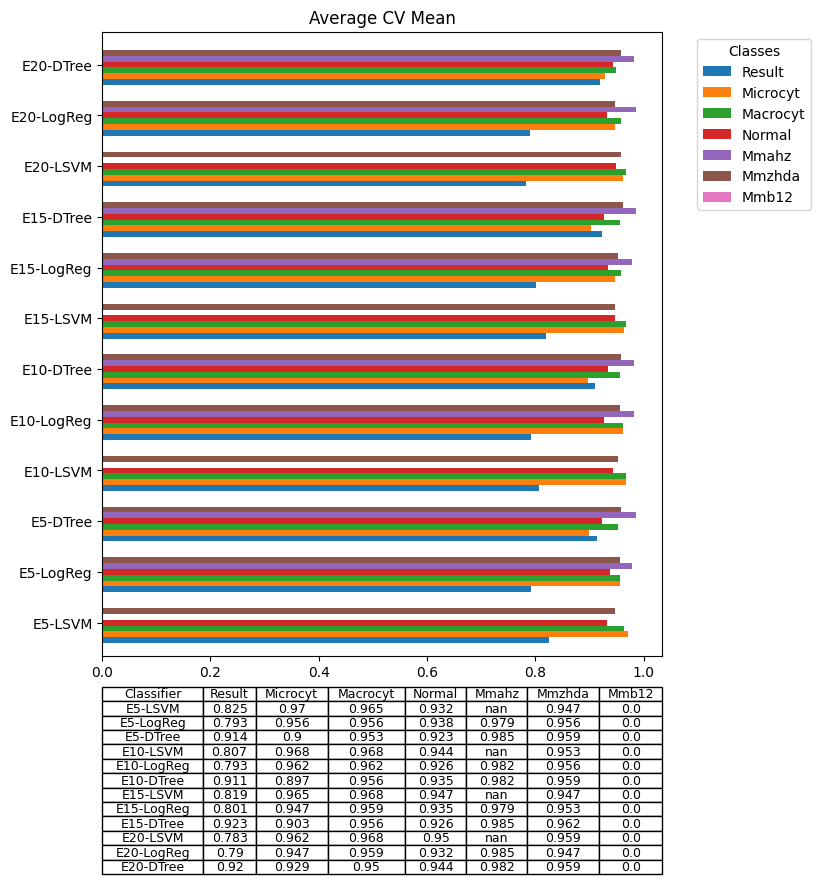

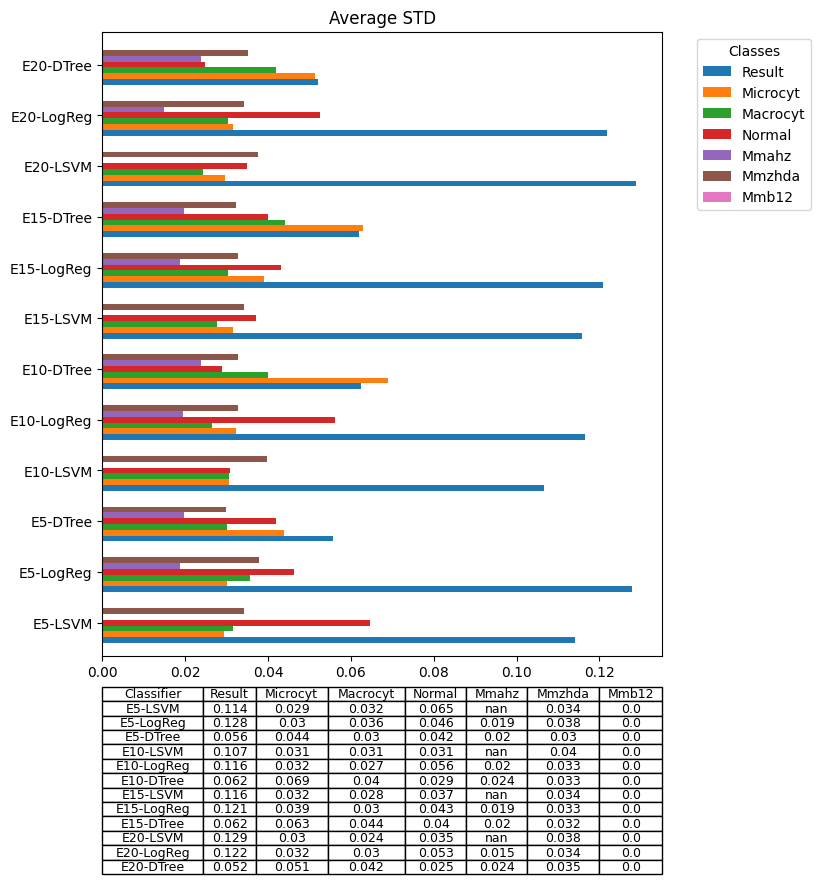

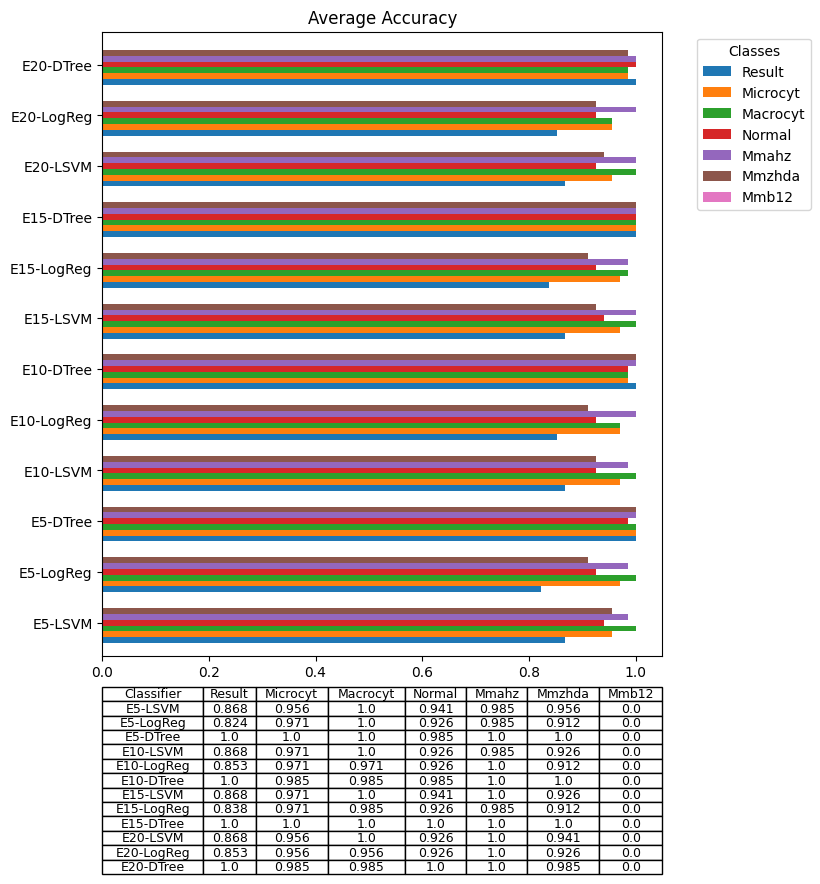

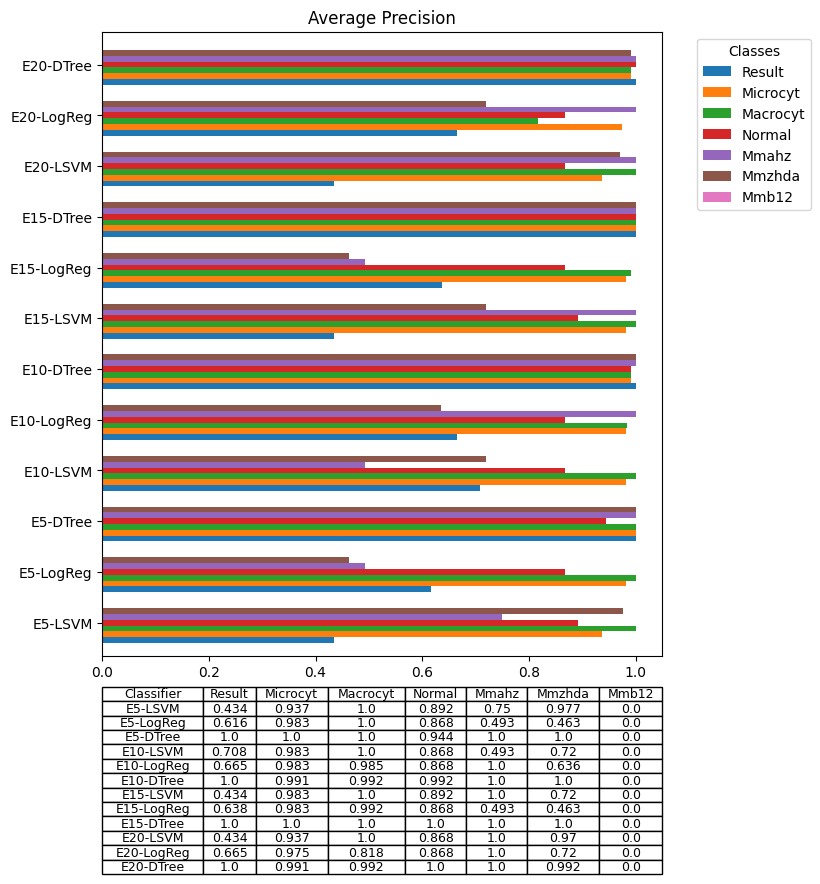

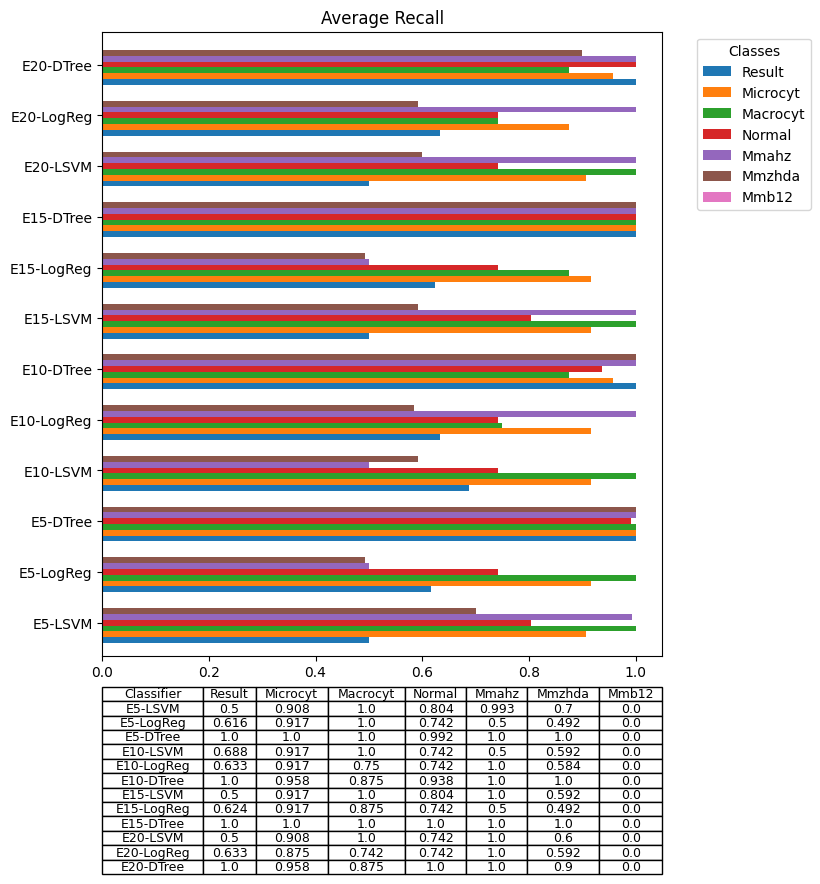

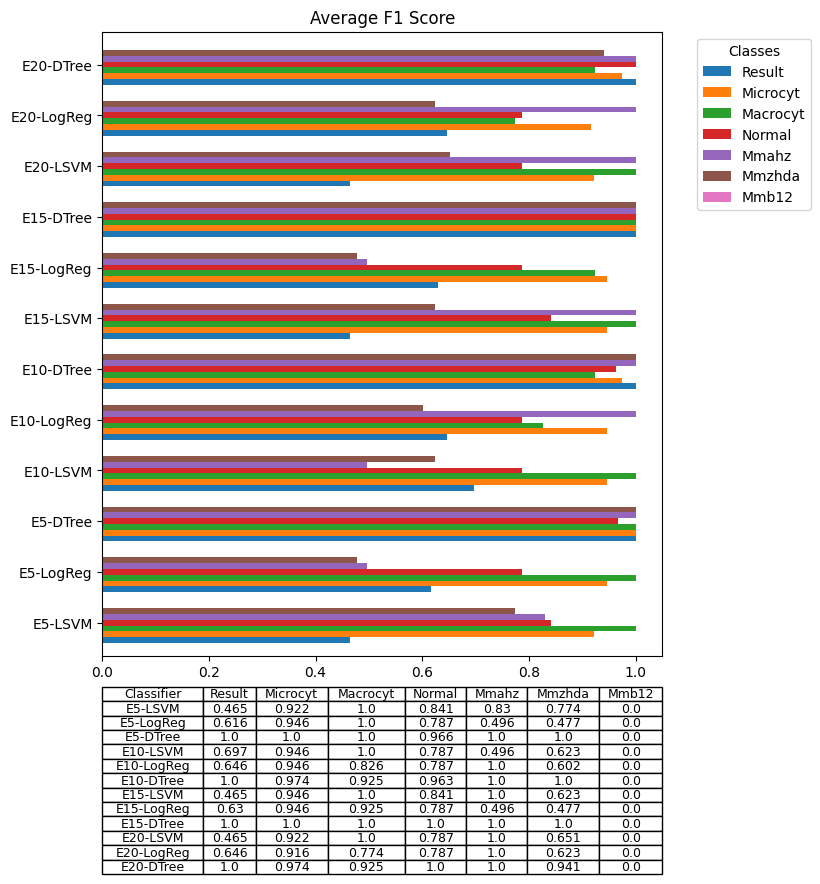

In [34]:
plot_stats(results_bag, classifiers)

## Voting

Обучение + оценка всех моделей (2) - 10 минут 

In [35]:
from sklearn.ensemble import VotingClassifier

types=['soft', 'hard']
base_classifiers=['LSVM','LogReg','DTree']

models = []
classifiers = []

for j in range(len(types)):
  classifiers.append(f"V{types[j]}-LSVM+LR+DT")
  models.append(VotingClassifier(
    estimators=[('svm', svm.SVC(kernel='linear', probability=True)), ('lr', LogisticRegression()), ('dt', DecisionTreeClassifier())],
    voting=types[j]
  ))

results_vtg = eval_models(models)

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

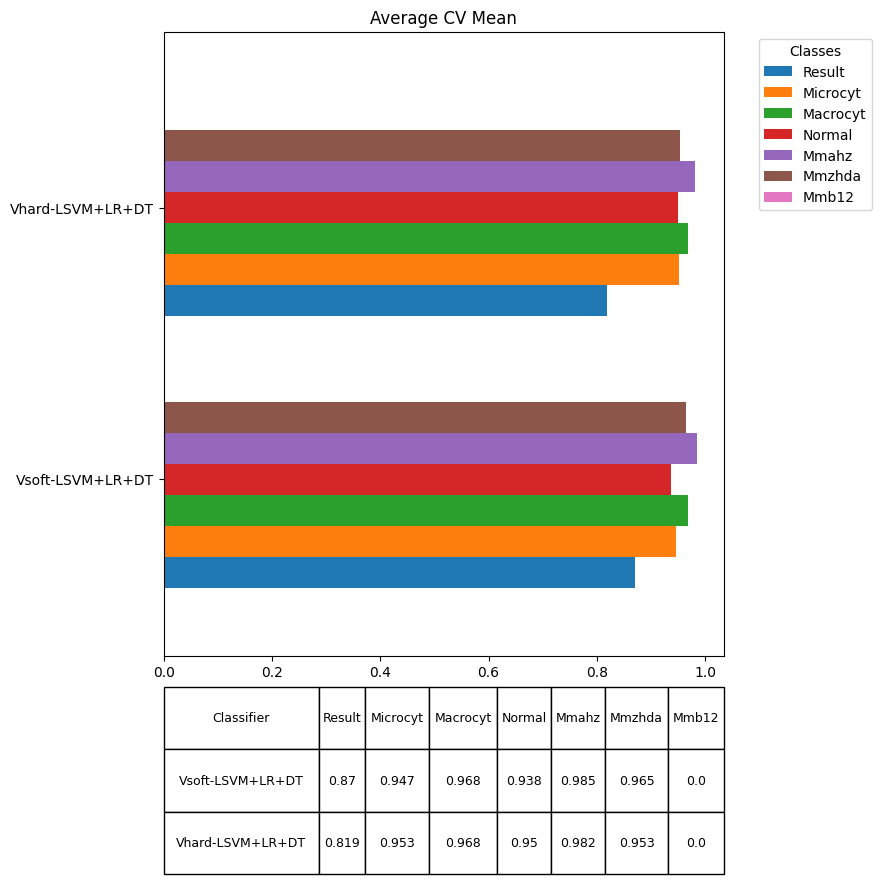

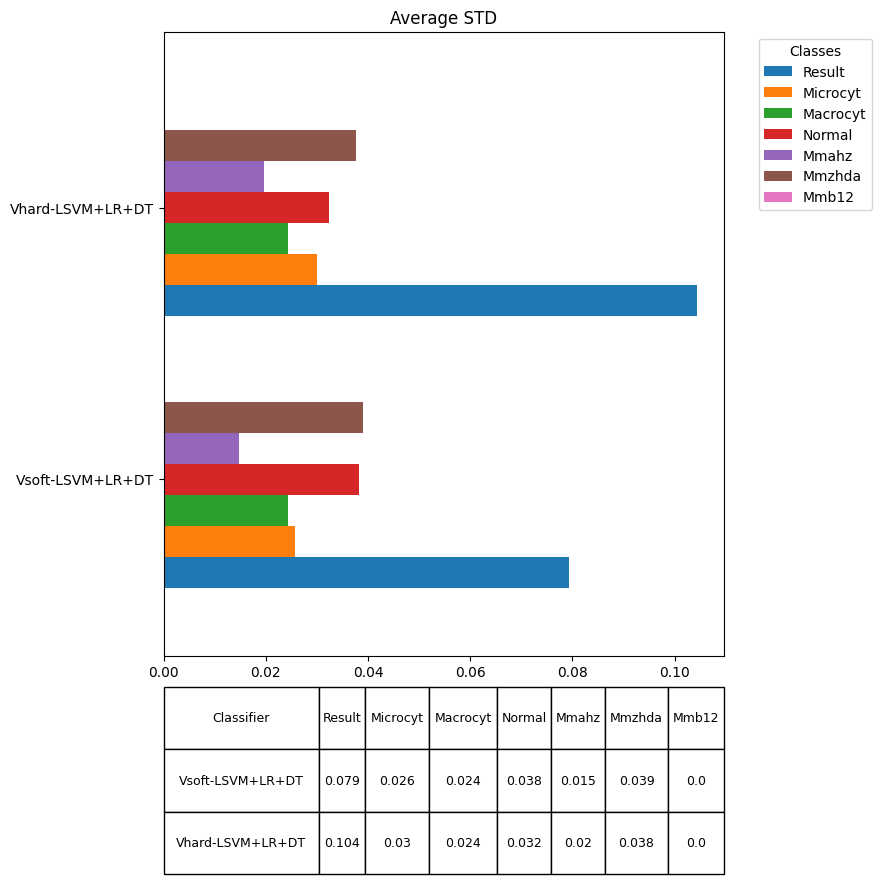

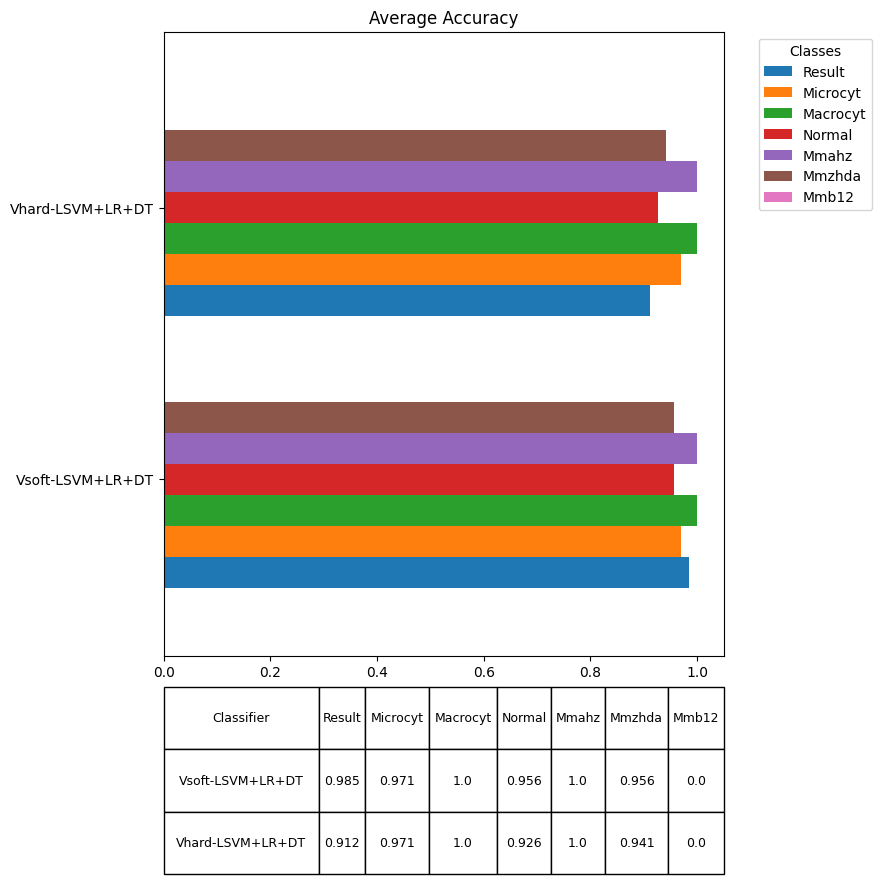

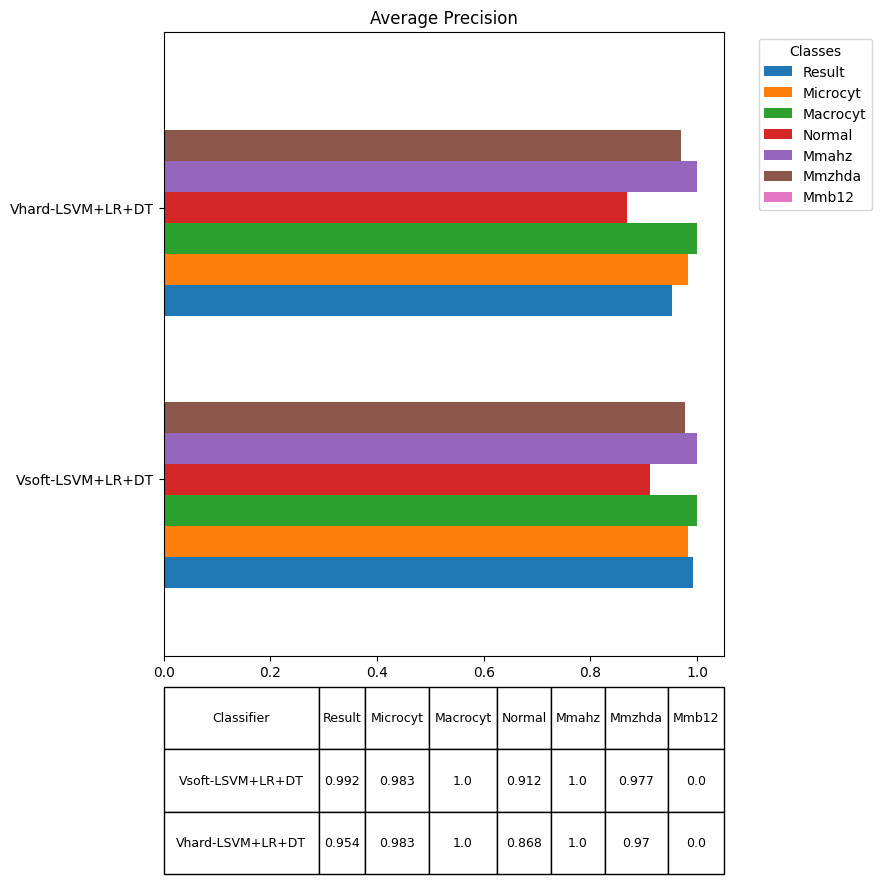

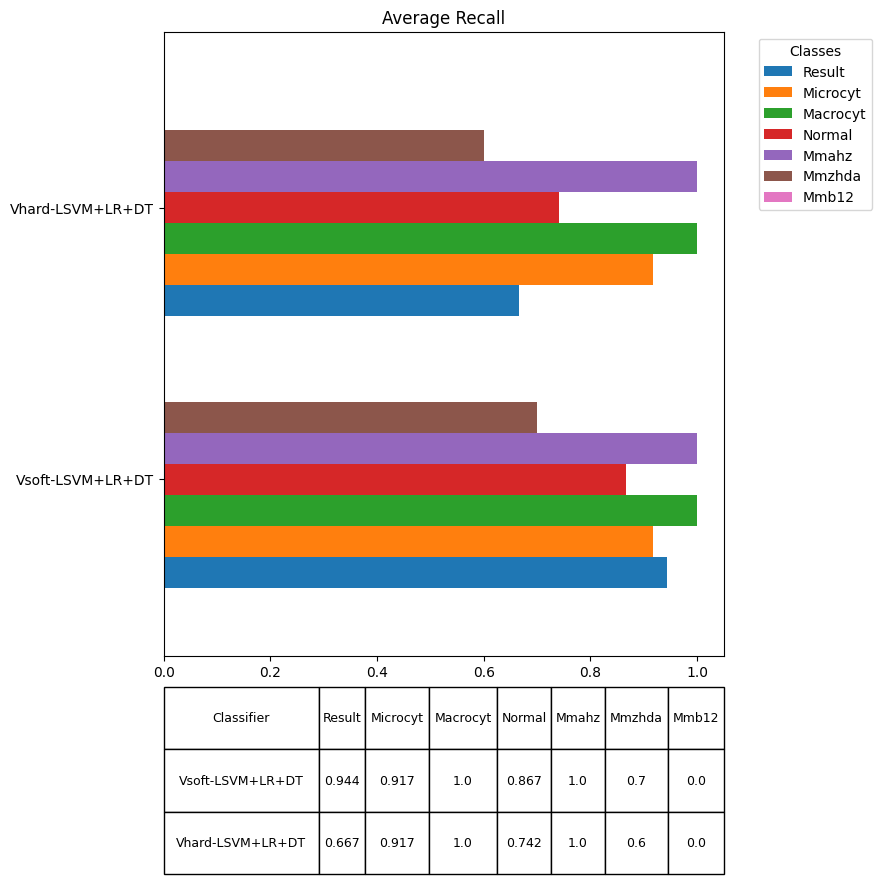

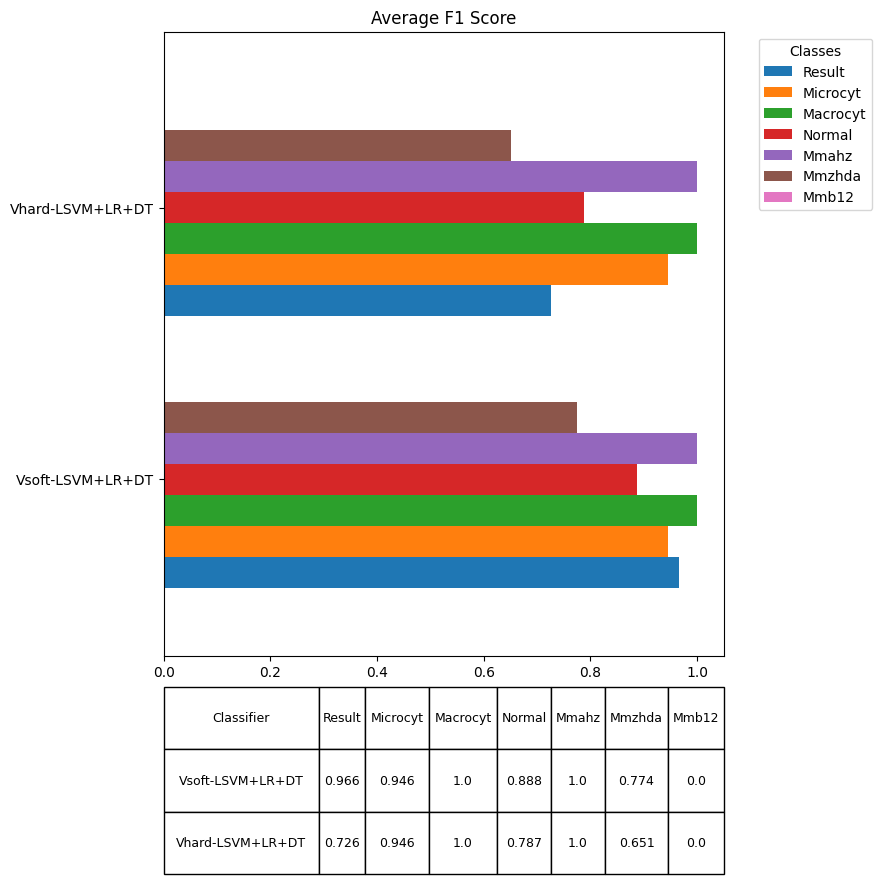

In [36]:
plot_stats(results_vtg, classifiers)

## Stacking

Обучение + оценка всех моделей (3) - 74 минуты

In [37]:
from sklearn.ensemble import StackingClassifier

ests = [svm.SVC(kernel='linear', probability=True), LogisticRegression(), DecisionTreeClassifier()]
base_classifiers=['LSVM','LogReg','DTree']

models = []
classifiers = []

for j in range(len(ests)):
  classifiers.append(f"FE-{base_classifiers[j]}")
  models.append(StackingClassifier(
      estimators=[('svm', svm.SVC(kernel='linear', probability=True)), ('lr', LogisticRegression()), ('dt', DecisionTreeClassifier())],
      final_estimator=ests[j]
  ))

results_stk = eval_models(models)

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

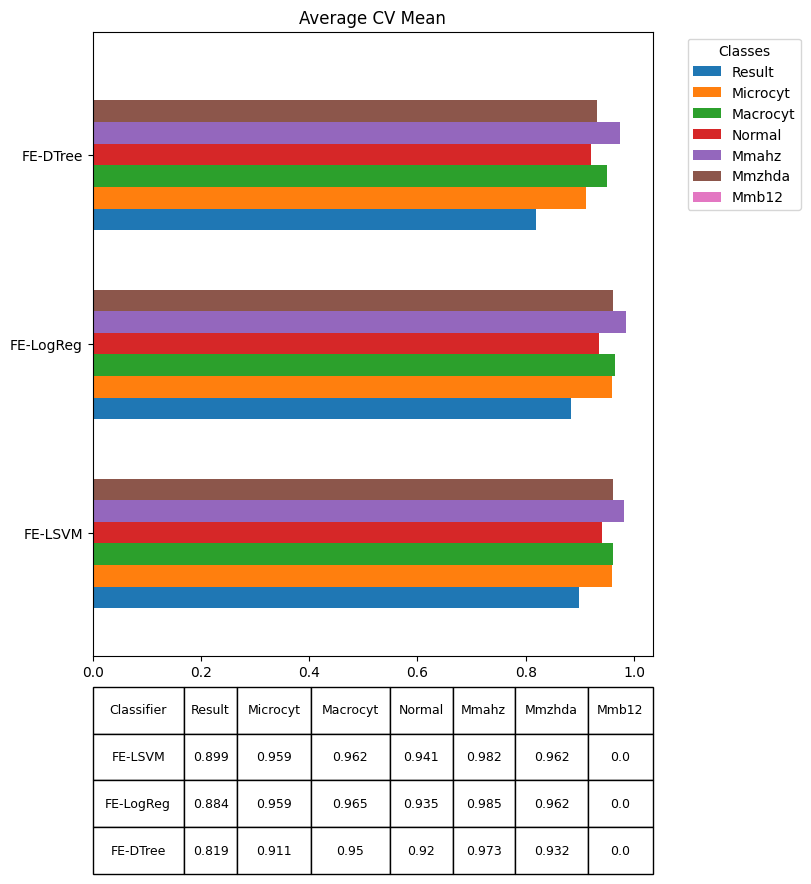

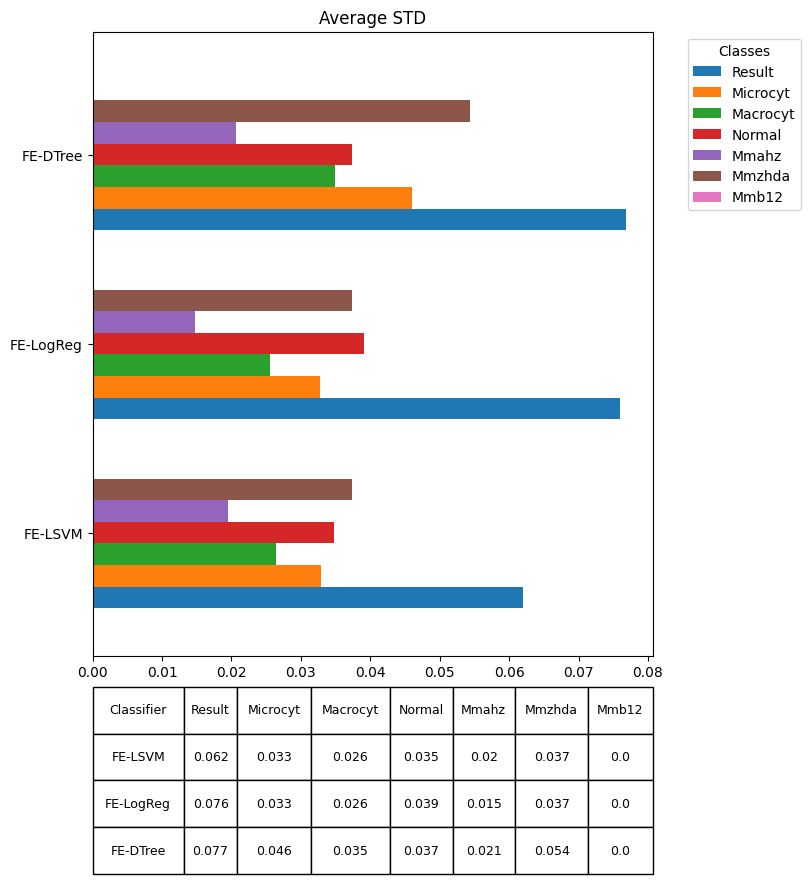

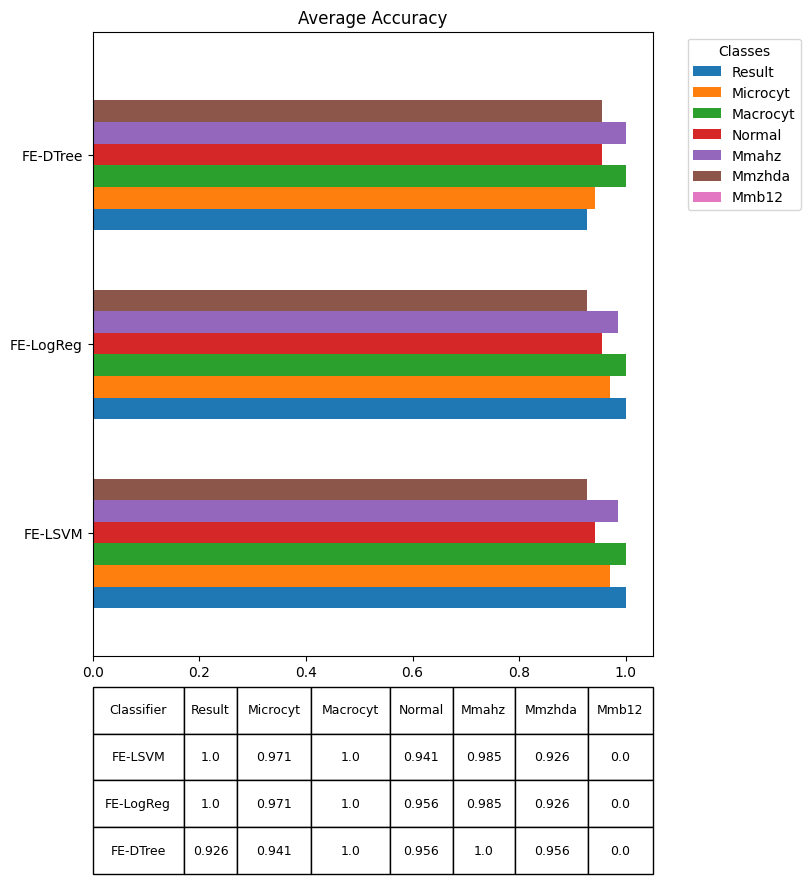

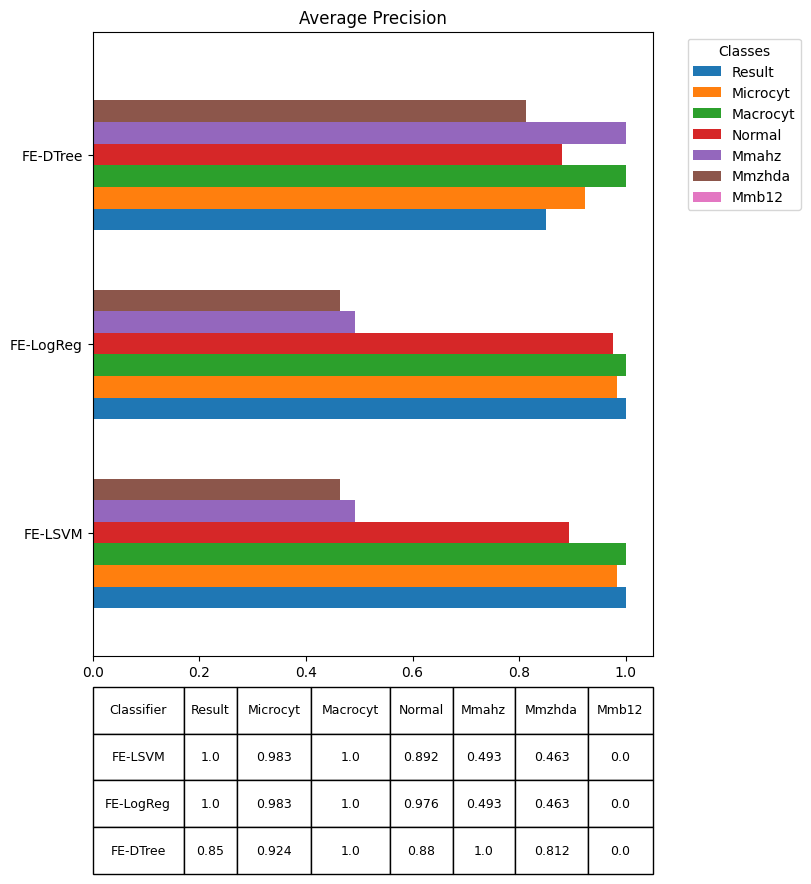

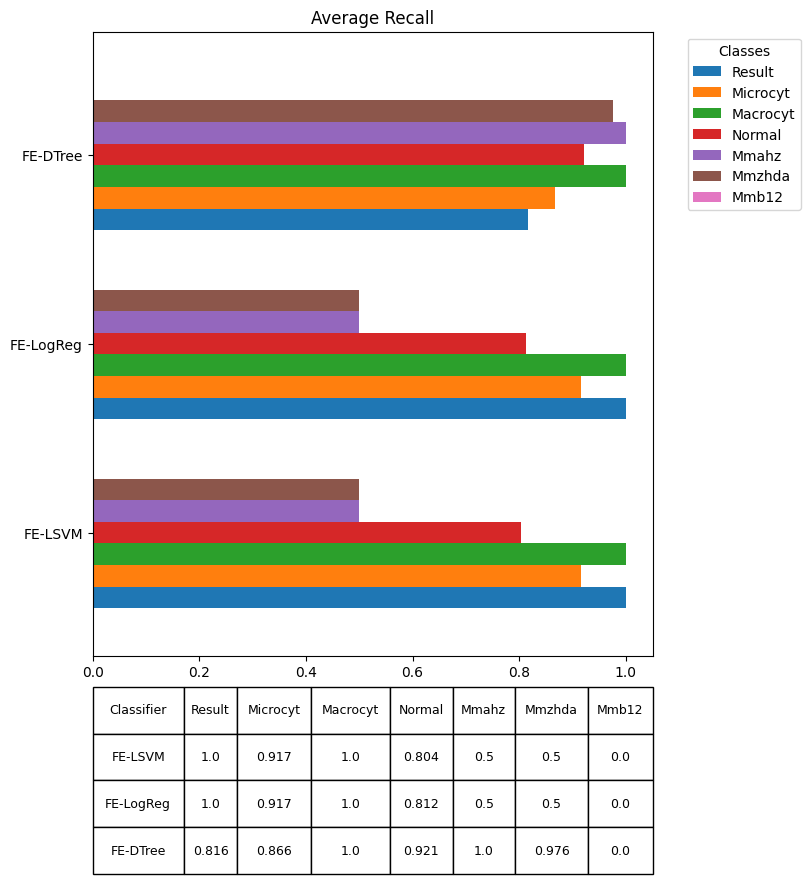

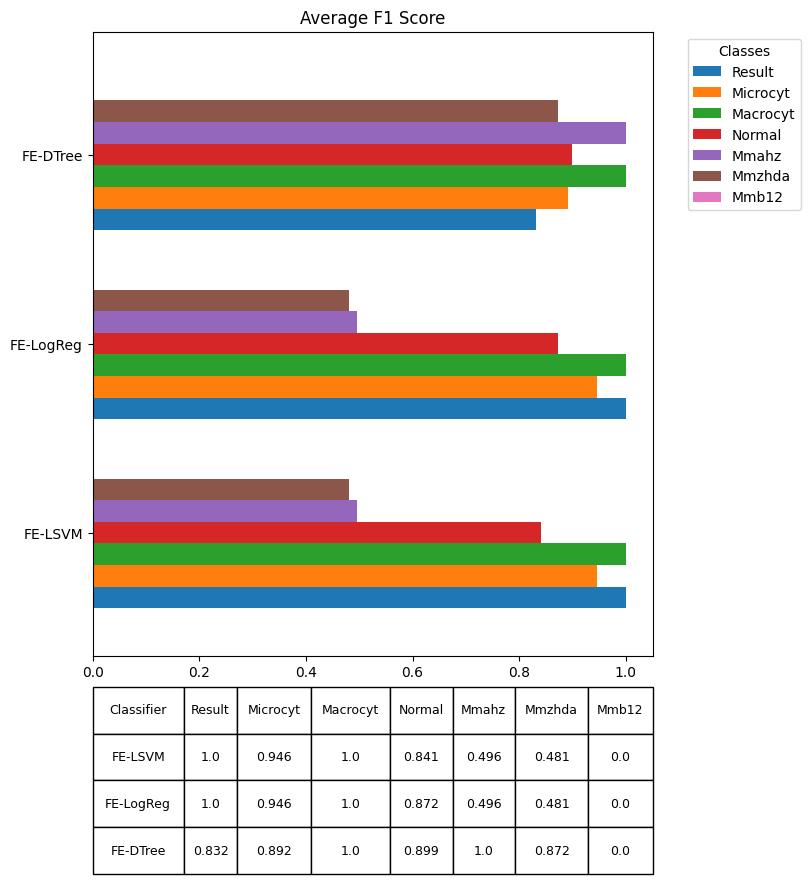

In [38]:
plot_stats(results_stk, classifiers)

# Neural Networks

In [29]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import RMSprop

import optuna

all_histories = []

def objective(trial):
    model = Sequential()

    n_units = trial.suggest_int('n_units', 2, 16, step=2)
    layers = trial.suggest_int('layers', 1, 5, step=1)
    epochs = trial.suggest_int('epochs', 10, 100, step=10)
    batch_size = trial.suggest_int('batch_size', 2, 32, step=2)
    # dropout_rate = trial.suggest_float('dropout', 0.1, 0.5)

    activation = trial.suggest_categorical('activation', ['relu', 'tanh'])
    lr = trial.suggest_float('lr', 1e-5, 1e-2, log=True)

    model.add(Dense(n_units, activation=activation, input_shape=(10,)))
    # model.add(Dropout(dropout_rate))
    for i in range(layers):
        model.add(Dense(n_units // 2, activation=activation))
    model.add(Dense(7, activation='sigmoid'))

    model.compile(loss='binary_crossentropy', optimizer=RMSprop(learning_rate=lr), metrics=['accuracy'])

    history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size, verbose=0, validation_data=(X_test, Y_test))

    Y_pred = model.predict(X_test)
    Y_pred_binary = (Y_pred > 0.5).astype(int)
    acc = accuracy_score(Y_test, Y_pred_binary)
    precision = precision_score(Y_test, Y_pred_binary, average='macro', zero_division=1)
    recall = recall_score(Y_test, Y_pred_binary, average='macro', zero_division=1)
    f1 = f1_score(Y_test, Y_pred_binary, average='macro', zero_division=1)

    all_histories.append({
        "history": history.history,
        "n_units": n_units,
        "layers": layers,
        "epochs": epochs,
        "batch_size": batch_size,
        "activation": activation,
        "lr": lr,

        "accuracy": acc,
        "precision": precision,
        "recall": recall,
        "f1": f1,
    })

    _, accuracy = model.evaluate(X_test, Y_test, verbose=0)
    
    return accuracy

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=200)

c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[I 2025-04-08 09:51:38,239] A new study created in memory with name: no-name-0d01efb4-422c-41b6-a840-6497a2b339fd
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


[I 2025-04-08 09:51:42,620] Trial 0 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 5, 'epochs': 30, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.00047819399928666174}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


[I 2025-04-08 09:51:49,781] Trial 1 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 4, 'epochs': 50, 'batch_size': 6, 'activation': 'tanh', 'lr': 2.3352560823990654e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/stepWARNING:tensorflow:6 out of the last 9 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x0000029694750680> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 09:51:54,747] Trial 2 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 1, 'epochs': 50, 'batch_size': 24, 'activation': 'tanh', 'lr': 0.0011870344744672793}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 09:52:02,427] Trial 3 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 2, 'epochs': 70, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.002682459253424551}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 09:52:10,225] Trial 4 finished with value: 0.8676470518112183 and parameters: {'n_units': 8, 'layers': 1, 'epochs': 80, 'batch_size': 22, 'activation': 'relu', 'lr': 0.00043134714088523843}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


[I 2025-04-08 09:52:16,072] Trial 5 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 2, 'epochs': 60, 'batch_size': 24, 'activation': 'tanh', 'lr': 0.00045757889702704817}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 09:52:20,767] Trial 6 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 1, 'epochs': 50, 'batch_size': 28, 'activation': 'tanh', 'lr': 0.0015035306848642646}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 09:52:24,936] Trial 7 finished with value: 0.779411792755127 and parameters: {'n_units': 12, 'layers': 2, 'epochs': 40, 'batch_size': 24, 'activation': 'tanh', 'lr': 1.6790764077014404e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


[I 2025-04-08 09:52:32,642] Trial 8 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 2, 'epochs': 70, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.0013825021175964671}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


[I 2025-04-08 09:52:40,880] Trial 9 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 3, 'epochs': 80, 'batch_size': 14, 'activation': 'relu', 'lr': 9.561870700789656e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


[I 2025-04-08 09:52:46,452] Trial 10 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 5, 'epochs': 20, 'batch_size': 2, 'activation': 'relu', 'lr': 0.009650063046351569}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 09:52:51,940] Trial 11 finished with value: 0.0 and parameters: {'n_units': 8, 'layers': 5, 'epochs': 20, 'batch_size': 2, 'activation': 'tanh', 'lr': 5.878518953086129e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 09:53:03,881] Trial 12 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 4, 'epochs': 100, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.00010393264562465746}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


[I 2025-04-08 09:53:07,661] Trial 13 finished with value: 0.36764705181121826 and parameters: {'n_units': 10, 'layers': 4, 'epochs': 30, 'batch_size': 16, 'activation': 'tanh', 'lr': 1.347550486172728e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 09:53:09,856] Trial 14 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 4, 'epochs': 10, 'batch_size': 8, 'activation': 'relu', 'lr': 0.00022820597678312272}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


[I 2025-04-08 09:53:15,596] Trial 15 finished with value: 0.9411764740943909 and parameters: {'n_units': 6, 'layers': 5, 'epochs': 40, 'batch_size': 6, 'activation': 'tanh', 'lr': 3.5607157159711534e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 09:53:19,406] Trial 16 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 4, 'epochs': 30, 'batch_size': 14, 'activation': 'tanh', 'lr': 0.00025308086832119623}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 09:53:21,900] Trial 17 finished with value: 0.0 and parameters: {'n_units': 6, 'layers': 3, 'epochs': 10, 'batch_size': 4, 'activation': 'tanh', 'lr': 3.2963734644845977e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 09:53:26,837] Trial 18 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 5, 'epochs': 40, 'batch_size': 12, 'activation': 'relu', 'lr': 0.005530873906080735}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 09:53:32,778] Trial 19 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 4, 'epochs': 60, 'batch_size': 18, 'activation': 'tanh', 'lr': 0.0007837026924505584}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


[I 2025-04-08 09:53:42,095] Trial 20 finished with value: 1.0 and parameters: {'n_units': 8, 'layers': 5, 'epochs': 100, 'batch_size': 18, 'activation': 'tanh', 'lr': 0.00017156556684844493}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


[I 2025-04-08 09:53:47,338] Trial 21 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 3, 'epochs': 50, 'batch_size': 32, 'activation': 'tanh', 'lr': 0.0009892150907553038}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


[I 2025-04-08 09:53:50,706] Trial 22 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 1, 'epochs': 30, 'batch_size': 22, 'activation': 'tanh', 'lr': 0.0005953176931202294}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 09:53:57,342] Trial 23 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 3, 'epochs': 50, 'batch_size': 6, 'activation': 'tanh', 'lr': 0.0029627423757151577}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 09:54:01,714] Trial 24 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 4, 'epochs': 40, 'batch_size': 28, 'activation': 'tanh', 'lr': 0.002621144035244588}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


[I 2025-04-08 09:54:08,377] Trial 25 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 5, 'epochs': 60, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.00016687215902770627}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


[I 2025-04-08 09:54:11,030] Trial 26 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 3, 'epochs': 20, 'batch_size': 20, 'activation': 'relu', 'lr': 0.0014647833268686735}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 09:54:17,545] Trial 27 finished with value: 0.13235294818878174 and parameters: {'n_units': 8, 'layers': 4, 'epochs': 70, 'batch_size': 28, 'activation': 'tanh', 'lr': 2.4180026539196543e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


[I 2025-04-08 09:54:24,210] Trial 28 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 5, 'epochs': 50, 'batch_size': 6, 'activation': 'tanh', 'lr': 0.00035118428283361714}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 09:54:32,084] Trial 29 finished with value: 0.8676470518112183 and parameters: {'n_units': 2, 'layers': 1, 'epochs': 80, 'batch_size': 10, 'activation': 'tanh', 'lr': 1.0170107661679123e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


[I 2025-04-08 09:54:35,292] Trial 30 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 2, 'epochs': 30, 'batch_size': 32, 'activation': 'tanh', 'lr': 0.002713085581954632}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 09:54:42,259] Trial 31 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 1, 'epochs': 70, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.004506140220167385}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 09:54:55,191] Trial 32 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 2, 'epochs': 90, 'batch_size': 4, 'activation': 'tanh', 'lr': 0.0004499250129632895}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


[I 2025-04-08 09:55:01,310] Trial 33 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 2, 'epochs': 60, 'batch_size': 14, 'activation': 'tanh', 'lr': 0.000899985880880748}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


[I 2025-04-08 09:55:08,486] Trial 34 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 1, 'epochs': 80, 'batch_size': 26, 'activation': 'relu', 'lr': 0.0016468510096141406}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 09:55:16,325] Trial 35 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 1, 'epochs': 70, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.0019608642398824924}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 09:55:22,029] Trial 36 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 2, 'epochs': 60, 'batch_size': 22, 'activation': 'tanh', 'lr': 0.0006402321362820502}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


[I 2025-04-08 09:55:26,623] Trial 37 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 3, 'epochs': 40, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.004841940607640528}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 09:55:31,751] Trial 38 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 2, 'epochs': 50, 'batch_size': 16, 'activation': 'relu', 'lr': 0.0011482659996979578}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 09:55:41,599] Trial 39 finished with value: 1.0 and parameters: {'n_units': 8, 'layers': 1, 'epochs': 70, 'batch_size': 4, 'activation': 'tanh', 'lr': 8.306106233744584e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


[I 2025-04-08 09:55:50,563] Trial 40 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 3, 'epochs': 90, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.0005828014194002925}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 09:55:56,190] Trial 41 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 2, 'epochs': 60, 'batch_size': 24, 'activation': 'tanh', 'lr': 0.00037252934022348965}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 09:56:01,022] Trial 42 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 2, 'epochs': 50, 'batch_size': 24, 'activation': 'tanh', 'lr': 0.00850319661517811}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


[I 2025-04-08 09:56:07,708] Trial 43 finished with value: 0.014705882407724857 and parameters: {'n_units': 2, 'layers': 2, 'epochs': 80, 'batch_size': 30, 'activation': 'tanh', 'lr': 0.0001430398019304111}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


[I 2025-04-08 09:56:11,813] Trial 44 finished with value: 0.970588207244873 and parameters: {'n_units': 6, 'layers': 1, 'epochs': 40, 'batch_size': 20, 'activation': 'tanh', 'lr': 0.00025645934430226574}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


[I 2025-04-08 09:56:18,356] Trial 45 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 4, 'epochs': 70, 'batch_size': 26, 'activation': 'relu', 'lr': 0.002212428730207093}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 09:56:23,183] Trial 46 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 3, 'epochs': 20, 'batch_size': 2, 'activation': 'tanh', 'lr': 0.0013472415529367334}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


[I 2025-04-08 09:56:30,887] Trial 47 finished with value: 1.0 and parameters: {'n_units': 8, 'layers': 4, 'epochs': 60, 'batch_size': 8, 'activation': 'tanh', 'lr': 6.271374516380466e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 09:56:35,879] Trial 48 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 2, 'epochs': 50, 'batch_size': 20, 'activation': 'tanh', 'lr': 0.00041056684018227045}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


[I 2025-04-08 09:56:39,849] Trial 49 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 5, 'epochs': 30, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.0005699892918865768}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


[I 2025-04-08 09:56:48,028] Trial 50 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 4, 'epochs': 90, 'batch_size': 26, 'activation': 'relu', 'lr': 0.003484921060506079}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 09:56:51,916] Trial 51 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 1, 'epochs': 40, 'batch_size': 28, 'activation': 'tanh', 'lr': 0.0007374498132414036}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


[I 2025-04-08 09:56:57,046] Trial 52 finished with value: 0.9852941036224365 and parameters: {'n_units': 2, 'layers': 1, 'epochs': 60, 'batch_size': 30, 'activation': 'tanh', 'lr': 0.0008840813139897786}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


[I 2025-04-08 09:57:02,167] Trial 53 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 1, 'epochs': 50, 'batch_size': 14, 'activation': 'tanh', 'lr': 0.0011504242865132432}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 09:57:06,121] Trial 54 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 1, 'epochs': 40, 'batch_size': 24, 'activation': 'tanh', 'lr': 0.001975694205353155}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 09:57:08,027] Trial 55 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 5, 'epochs': 10, 'batch_size': 30, 'activation': 'tanh', 'lr': 0.00021696901980111787}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 09:57:14,275] Trial 56 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 2, 'epochs': 50, 'batch_size': 6, 'activation': 'tanh', 'lr': 0.00028642406057608876}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


[I 2025-04-08 09:57:20,871] Trial 57 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 3, 'epochs': 70, 'batch_size': 22, 'activation': 'tanh', 'lr': 0.006767183836487048}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 09:57:26,325] Trial 58 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 1, 'epochs': 60, 'batch_size': 18, 'activation': 'tanh', 'lr': 0.0036392726925396153}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


[I 2025-04-08 09:57:30,846] Trial 59 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 4, 'epochs': 40, 'batch_size': 26, 'activation': 'tanh', 'lr': 0.0004821781402835527}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


[I 2025-04-08 09:57:36,321] Trial 60 finished with value: 0.7941176295280457 and parameters: {'n_units': 14, 'layers': 5, 'epochs': 50, 'batch_size': 16, 'activation': 'relu', 'lr': 1.6491971406768306e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


[I 2025-04-08 09:57:43,947] Trial 61 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 2, 'epochs': 70, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.0016714189998405507}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 09:57:52,812] Trial 62 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 2, 'epochs': 80, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.0011811131256182531}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


[I 2025-04-08 09:58:00,260] Trial 63 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 3, 'epochs': 60, 'batch_size': 6, 'activation': 'tanh', 'lr': 0.0007505708437900784}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


[I 2025-04-08 09:58:15,344] Trial 64 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 2, 'epochs': 70, 'batch_size': 2, 'activation': 'tanh', 'lr': 3.167866607779768e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 09:58:23,107] Trial 65 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 1, 'epochs': 80, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.0016121620247680358}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


[I 2025-04-08 09:58:29,274] Trial 66 finished with value: 1.0 and parameters: {'n_units': 8, 'layers': 1, 'epochs': 60, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.0022400993274413177}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 09:58:32,211] Trial 67 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 3, 'epochs': 20, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.003686310996231723}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 09:58:35,317] Trial 68 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 2, 'epochs': 30, 'batch_size': 28, 'activation': 'tanh', 'lr': 0.0010703376015621805}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


[I 2025-04-08 09:58:42,215] Trial 69 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 1, 'epochs': 50, 'batch_size': 4, 'activation': 'tanh', 'lr': 0.002846327944665172}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


[I 2025-04-08 09:58:43,938] Trial 70 finished with value: 0.8088235259056091 and parameters: {'n_units': 12, 'layers': 2, 'epochs': 10, 'batch_size': 14, 'activation': 'relu', 'lr': 0.0003151308378409617}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 09:58:51,835] Trial 71 finished with value: 0.44117647409439087 and parameters: {'n_units': 16, 'layers': 3, 'epochs': 80, 'batch_size': 10, 'activation': 'relu', 'lr': 5.314859472812388e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 09:58:58,807] Trial 72 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 4, 'epochs': 70, 'batch_size': 14, 'activation': 'relu', 'lr': 0.00010090096048280761}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 09:59:07,359] Trial 73 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 5, 'epochs': 90, 'batch_size': 16, 'activation': 'relu', 'lr': 0.00014246954100358025}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 09:59:13,433] Trial 74 finished with value: 0.9852941036224365 and parameters: {'n_units': 10, 'layers': 2, 'epochs': 60, 'batch_size': 12, 'activation': 'relu', 'lr': 0.0004905687109637819}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 09:59:21,271] Trial 75 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 3, 'epochs': 70, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.00018324056210416968}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 09:59:28,263] Trial 76 finished with value: 0.7941176295280457 and parameters: {'n_units': 6, 'layers': 2, 'epochs': 80, 'batch_size': 22, 'activation': 'tanh', 'lr': 1.1113889851872596e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 09:59:33,727] Trial 77 finished with value: 0.23529411852359772 and parameters: {'n_units': 12, 'layers': 4, 'epochs': 60, 'batch_size': 32, 'activation': 'relu', 'lr': 2.3333842411403504e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 09:59:39,050] Trial 78 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 3, 'epochs': 50, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.0013343394354556957}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 09:59:46,312] Trial 79 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 5, 'epochs': 70, 'batch_size': 20, 'activation': 'tanh', 'lr': 0.000912448929353316}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


[I 2025-04-08 09:59:50,478] Trial 80 finished with value: 0.4264705777168274 and parameters: {'n_units': 16, 'layers': 1, 'epochs': 40, 'batch_size': 10, 'activation': 'tanh', 'lr': 4.3090723563761826e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 09:59:55,509] Trial 81 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 5, 'epochs': 20, 'batch_size': 2, 'activation': 'relu', 'lr': 0.008918806649538327}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 09:59:58,721] Trial 82 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 5, 'epochs': 20, 'batch_size': 6, 'activation': 'relu', 'lr': 0.006301261291026344}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 10:00:03,763] Trial 83 finished with value: 1.0 and parameters: {'n_units': 8, 'layers': 4, 'epochs': 30, 'batch_size': 4, 'activation': 'relu', 'lr': 0.004728877318451073}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:00:12,642] Trial 84 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 5, 'epochs': 100, 'batch_size': 24, 'activation': 'relu', 'lr': 0.0007045806428381967}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 10:00:17,724] Trial 85 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 4, 'epochs': 30, 'batch_size': 4, 'activation': 'relu', 'lr': 0.001881762960830554}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:00:19,884] Trial 86 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 5, 'epochs': 10, 'batch_size': 6, 'activation': 'tanh', 'lr': 0.0025267601836455366}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 10:00:24,217] Trial 87 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 2, 'epochs': 50, 'batch_size': 30, 'activation': 'tanh', 'lr': 0.0005357219326009552}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


[I 2025-04-08 10:00:30,753] Trial 88 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 1, 'epochs': 60, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.0008557356938450063}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:00:38,699] Trial 89 finished with value: 1.0 and parameters: {'n_units': 8, 'layers': 5, 'epochs': 90, 'batch_size': 18, 'activation': 'tanh', 'lr': 7.803336284682297e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 10:00:52,224] Trial 90 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 2, 'epochs': 70, 'batch_size': 2, 'activation': 'relu', 'lr': 0.0003822081518087547}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 10:01:03,382] Trial 91 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 4, 'epochs': 100, 'batch_size': 8, 'activation': 'tanh', 'lr': 2.5431255500544998e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 10:01:08,746] Trial 92 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 4, 'epochs': 50, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.0002455307009503701}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:01:18,433] Trial 93 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 5, 'epochs': 80, 'batch_size': 6, 'activation': 'tanh', 'lr': 0.0001243362333998056}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 10:01:24,558] Trial 94 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 3, 'epochs': 60, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.00019595597678643984}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:01:35,530] Trial 95 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 4, 'epochs': 100, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.0013495316036284213}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


[I 2025-04-08 10:01:43,880] Trial 96 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 1, 'epochs': 90, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.0006334321097185563}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:01:49,902] Trial 97 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 3, 'epochs': 50, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.0003070374448840394}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 10:01:53,780] Trial 98 finished with value: 0.14705882966518402 and parameters: {'n_units': 10, 'layers': 2, 'epochs': 40, 'batch_size': 26, 'activation': 'tanh', 'lr': 6.665374400556075e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


[I 2025-04-08 10:02:00,460] Trial 99 finished with value: 0.970588207244873 and parameters: {'n_units': 16, 'layers': 1, 'epochs': 80, 'batch_size': 28, 'activation': 'tanh', 'lr': 4.0441393559591215e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:02:05,865] Trial 100 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 5, 'epochs': 40, 'batch_size': 6, 'activation': 'tanh', 'lr': 0.00011284866164378524}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 10:02:07,926] Trial 101 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 4, 'epochs': 10, 'batch_size': 8, 'activation': 'relu', 'lr': 0.007359529059009039}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 10:02:09,831] Trial 102 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 4, 'epochs': 10, 'batch_size': 10, 'activation': 'relu', 'lr': 9.808105707688506e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:02:12,927] Trial 103 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 4, 'epochs': 20, 'batch_size': 8, 'activation': 'relu', 'lr': 0.004091274877758273}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:02:15,665] Trial 104 finished with value: 0.07352941483259201 and parameters: {'n_units': 4, 'layers': 4, 'epochs': 20, 'batch_size': 14, 'activation': 'relu', 'lr': 0.0002339021408526809}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 10:02:17,357] Trial 105 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 2, 'epochs': 10, 'batch_size': 10, 'activation': 'relu', 'lr': 0.0023007041582271204}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 10:02:24,515] Trial 106 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 3, 'epochs': 60, 'batch_size': 6, 'activation': 'tanh', 'lr': 0.009907117059104131}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:02:32,387] Trial 107 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 4, 'epochs': 50, 'batch_size': 4, 'activation': 'relu', 'lr': 0.0009886342825263681}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 10:02:35,766] Trial 108 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 1, 'epochs': 30, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.0004532927469969431}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:02:42,667] Trial 109 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 5, 'epochs': 70, 'batch_size': 16, 'activation': 'tanh', 'lr': 0.00016079406997270354}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 10:02:44,378] Trial 110 finished with value: 0.0 and parameters: {'n_units': 4, 'layers': 3, 'epochs': 10, 'batch_size': 24, 'activation': 'tanh', 'lr': 0.00036253712733566026}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 10:02:47,111] Trial 111 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 4, 'epochs': 20, 'batch_size': 14, 'activation': 'tanh', 'lr': 0.00027326291771918485}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:02:50,402] Trial 112 finished with value: 0.9852941036224365 and parameters: {'n_units': 8, 'layers': 4, 'epochs': 30, 'batch_size': 18, 'activation': 'tanh', 'lr': 0.00021773065509070967}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:02:54,950] Trial 113 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 4, 'epochs': 40, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.005443136751276632}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


[I 2025-04-08 10:02:59,912] Trial 114 finished with value: 0.0 and parameters: {'n_units': 8, 'layers': 4, 'epochs': 50, 'batch_size': 22, 'activation': 'tanh', 'lr': 0.00014575251446080132}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 10:03:04,116] Trial 115 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 2, 'epochs': 40, 'batch_size': 14, 'activation': 'relu', 'lr': 0.0018930935988287253}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:03:06,835] Trial 116 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 5, 'epochs': 20, 'batch_size': 20, 'activation': 'tanh', 'lr': 0.0015319799413674045}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


[I 2025-04-08 10:03:13,319] Trial 117 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 1, 'epochs': 60, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.0031894844185322564}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 10:03:21,135] Trial 118 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 3, 'epochs': 70, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.0003339631091423931}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 10:03:28,978] Trial 119 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 4, 'epochs': 90, 'batch_size': 26, 'activation': 'relu', 'lr': 0.0012116107315610601}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 10:03:31,420] Trial 120 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 2, 'epochs': 20, 'batch_size': 22, 'activation': 'tanh', 'lr': 0.0004334903393717404}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 10:03:35,231] Trial 121 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 5, 'epochs': 30, 'batch_size': 12, 'activation': 'relu', 'lr': 0.0060619512633318}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


[I 2025-04-08 10:03:38,901] Trial 122 finished with value: 0.0 and parameters: {'n_units': 16, 'layers': 5, 'epochs': 30, 'batch_size': 16, 'activation': 'relu', 'lr': 1.4485519670881388e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:03:44,501] Trial 123 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 5, 'epochs': 50, 'batch_size': 10, 'activation': 'relu', 'lr': 0.0005328541090934636}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:03:49,064] Trial 124 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 5, 'epochs': 40, 'batch_size': 14, 'activation': 'relu', 'lr': 0.005212072395157414}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 10:03:55,048] Trial 125 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 4, 'epochs': 50, 'batch_size': 8, 'activation': 'relu', 'lr': 0.007804918915625955}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


[I 2025-04-08 10:03:58,837] Trial 126 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 5, 'epochs': 30, 'batch_size': 10, 'activation': 'tanh', 'lr': 7.647791592639071e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


[I 2025-04-08 10:04:03,339] Trial 127 finished with value: 0.0 and parameters: {'n_units': 2, 'layers': 1, 'epochs': 50, 'batch_size': 28, 'activation': 'tanh', 'lr': 5.2878505386883436e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:04:11,003] Trial 128 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 3, 'epochs': 80, 'batch_size': 14, 'activation': 'tanh', 'lr': 0.002652129095357802}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:04:15,378] Trial 129 finished with value: 0.0 and parameters: {'n_units': 14, 'layers': 2, 'epochs': 50, 'batch_size': 30, 'activation': 'relu', 'lr': 0.00019869316987366047}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 10:04:19,477] Trial 130 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 5, 'epochs': 40, 'batch_size': 32, 'activation': 'tanh', 'lr': 0.0030967729818929222}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:04:25,450] Trial 131 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 4, 'epochs': 60, 'batch_size': 16, 'activation': 'tanh', 'lr': 0.0007888463390815109}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:04:31,816] Trial 132 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 4, 'epochs': 60, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.000984849312593477}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:04:39,022] Trial 133 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 4, 'epochs': 70, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.0006663574254687622}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 10:04:45,405] Trial 134 finished with value: 0.6470588445663452 and parameters: {'n_units': 2, 'layers': 4, 'epochs': 60, 'batch_size': 12, 'activation': 'tanh', 'lr': 2.1172732483899994e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:04:51,387] Trial 135 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 4, 'epochs': 50, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.001697705522989641}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:04:58,315] Trial 136 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 4, 'epochs': 60, 'batch_size': 8, 'activation': 'relu', 'lr': 0.0008005114969112987}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


[I 2025-04-08 10:05:01,342] Trial 137 finished with value: 0.9852941036224365 and parameters: {'n_units': 2, 'layers': 1, 'epochs': 30, 'batch_size': 18, 'activation': 'tanh', 'lr': 0.0013626760050450429}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


[I 2025-04-08 10:05:06,477] Trial 138 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 2, 'epochs': 50, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.0005888898014966543}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 10:05:15,722] Trial 139 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 5, 'epochs': 90, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.0004041397431098304}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 10:05:24,750] Trial 140 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 3, 'epochs': 70, 'batch_size': 6, 'activation': 'relu', 'lr': 0.0011994466465096022}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


[I 2025-04-08 10:05:33,628] Trial 141 finished with value: 1.0 and parameters: {'n_units': 8, 'layers': 5, 'epochs': 100, 'batch_size': 18, 'activation': 'tanh', 'lr': 0.0001649237321427794}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:05:42,751] Trial 142 finished with value: 1.0 and parameters: {'n_units': 8, 'layers': 5, 'epochs': 100, 'batch_size': 20, 'activation': 'tanh', 'lr': 0.00012245713874865056}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:05:51,606] Trial 143 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 5, 'epochs': 100, 'batch_size': 24, 'activation': 'tanh', 'lr': 0.00028195124336321257}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:06:01,063] Trial 144 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 5, 'epochs': 100, 'batch_size': 16, 'activation': 'tanh', 'lr': 8.838051288026134e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:06:13,514] Trial 145 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 4, 'epochs': 60, 'batch_size': 2, 'activation': 'tanh', 'lr': 0.004161470248976347}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:06:16,082] Trial 146 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 2, 'epochs': 20, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.0003404731602492848}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


[I 2025-04-08 10:06:20,275] Trial 147 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 5, 'epochs': 40, 'batch_size': 18, 'activation': 'tanh', 'lr': 0.00025061402401347624}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


[I 2025-04-08 10:06:28,863] Trial 148 finished with value: 0.970588207244873 and parameters: {'n_units': 16, 'layers': 1, 'epochs': 100, 'batch_size': 20, 'activation': 'relu', 'lr': 0.0001810787607734198}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 10:06:36,476] Trial 149 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 4, 'epochs': 80, 'batch_size': 16, 'activation': 'tanh', 'lr': 0.0010420279093231793}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 10:06:45,241] Trial 150 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 5, 'epochs': 90, 'batch_size': 14, 'activation': 'tanh', 'lr': 0.002098278347201803}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:06:49,911] Trial 151 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 3, 'epochs': 50, 'batch_size': 32, 'activation': 'tanh', 'lr': 0.0009193612371071302}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:06:54,591] Trial 152 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 3, 'epochs': 50, 'batch_size': 28, 'activation': 'tanh', 'lr': 0.0017237253099054307}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 10:06:59,308] Trial 153 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 3, 'epochs': 50, 'batch_size': 26, 'activation': 'tanh', 'lr': 0.0007083110469787843}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:07:04,442] Trial 154 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 3, 'epochs': 60, 'batch_size': 30, 'activation': 'tanh', 'lr': 0.0004947587148702941}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 10:07:09,409] Trial 155 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 4, 'epochs': 50, 'batch_size': 22, 'activation': 'relu', 'lr': 0.00908196623197521}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 10:07:13,356] Trial 156 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 2, 'epochs': 40, 'batch_size': 24, 'activation': 'tanh', 'lr': 0.00021717053706903666}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:07:16,093] Trial 157 finished with value: 0.0 and parameters: {'n_units': 2, 'layers': 3, 'epochs': 20, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.00014300921229226248}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


[I 2025-04-08 10:07:22,867] Trial 158 finished with value: 1.0 and parameters: {'n_units': 8, 'layers': 1, 'epochs': 70, 'batch_size': 12, 'activation': 'relu', 'lr': 0.0014342928417518796}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


[I 2025-04-08 10:07:26,293] Trial 159 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 5, 'epochs': 30, 'batch_size': 32, 'activation': 'tanh', 'lr': 0.0012276858418572162}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 10:07:32,635] Trial 160 finished with value: 0.970588207244873 and parameters: {'n_units': 2, 'layers': 4, 'epochs': 50, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.00010759719663267907}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


[I 2025-04-08 10:07:35,694] Trial 161 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 1, 'epochs': 30, 'batch_size': 24, 'activation': 'tanh', 'lr': 0.0005727255112912552}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


[I 2025-04-08 10:07:38,728] Trial 162 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 1, 'epochs': 30, 'batch_size': 18, 'activation': 'tanh', 'lr': 0.001079085828163159}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


[I 2025-04-08 10:07:41,851] Trial 163 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 1, 'epochs': 30, 'batch_size': 22, 'activation': 'tanh', 'lr': 0.0006187999152650938}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


[I 2025-04-08 10:07:43,384] Trial 164 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 1, 'epochs': 10, 'batch_size': 26, 'activation': 'tanh', 'lr': 0.0007866799191496562}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 10:07:49,359] Trial 165 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 2, 'epochs': 40, 'batch_size': 4, 'activation': 'tanh', 'lr': 0.0004124262545575991}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


[I 2025-04-08 10:07:54,835] Trial 166 finished with value: 0.9852941036224365 and parameters: {'n_units': 4, 'layers': 1, 'epochs': 60, 'batch_size': 20, 'activation': 'relu', 'lr': 0.0008468709212275217}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:07:58,874] Trial 167 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 3, 'epochs': 40, 'batch_size': 24, 'activation': 'tanh', 'lr': 0.0003141424338775207}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:08:02,564] Trial 168 finished with value: 0.029411764815449715 and parameters: {'n_units': 16, 'layers': 4, 'epochs': 20, 'batch_size': 28, 'activation': 'tanh', 'lr': 1.1768562321020956e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:08:08,164] Trial 169 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 5, 'epochs': 50, 'batch_size': 10, 'activation': 'relu', 'lr': 0.0005036544131139543}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


[I 2025-04-08 10:08:15,054] Trial 170 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 1, 'epochs': 60, 'batch_size': 6, 'activation': 'tanh', 'lr': 0.0002770188788963874}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:08:22,526] Trial 171 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 3, 'epochs': 50, 'batch_size': 4, 'activation': 'tanh', 'lr': 0.003662363625363422}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:08:28,710] Trial 172 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 3, 'epochs': 50, 'batch_size': 6, 'activation': 'tanh', 'lr': 0.005928509444278729}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 10:08:34,624] Trial 173 finished with value: 1.0 and parameters: {'n_units': 8, 'layers': 3, 'epochs': 50, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.00743610288647665}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 10:08:40,580] Trial 174 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 3, 'epochs': 50, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.004442383193462587}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 10:08:43,781] Trial 175 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 4, 'epochs': 30, 'batch_size': 30, 'activation': 'tanh', 'lr': 0.0015056442672470942}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:08:50,480] Trial 176 finished with value: 1.0 and parameters: {'n_units': 8, 'layers': 5, 'epochs': 70, 'batch_size': 22, 'activation': 'tanh', 'lr': 0.0024687081736893242}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:09:04,049] Trial 177 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 2, 'epochs': 100, 'batch_size': 4, 'activation': 'relu', 'lr': 0.003137787724101831}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:09:09,322] Trial 178 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 3, 'epochs': 40, 'batch_size': 6, 'activation': 'tanh', 'lr': 6.559652756516077e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:09:17,514] Trial 179 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 4, 'epochs': 80, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.0003780214972626088}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


[I 2025-04-08 10:09:23,254] Trial 180 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 5, 'epochs': 60, 'batch_size': 26, 'activation': 'tanh', 'lr': 0.0006433937298831608}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:09:27,301] Trial 181 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 4, 'epochs': 40, 'batch_size': 28, 'activation': 'tanh', 'lr': 0.0019146611939817241}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


[I 2025-04-08 10:09:30,655] Trial 182 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 4, 'epochs': 30, 'batch_size': 24, 'activation': 'tanh', 'lr': 0.002042804776372164}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:09:33,673] Trial 183 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 4, 'epochs': 10, 'batch_size': 2, 'activation': 'tanh', 'lr': 0.000953349928244026}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 10:09:39,163] Trial 184 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 4, 'epochs': 50, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.0029623711108795483}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:09:47,844] Trial 185 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 4, 'epochs': 90, 'batch_size': 14, 'activation': 'relu', 'lr': 0.002508088529601569}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 10:09:52,116] Trial 186 finished with value: 0.07352941483259201 and parameters: {'n_units': 14, 'layers': 1, 'epochs': 50, 'batch_size': 30, 'activation': 'tanh', 'lr': 2.970435138893213e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


[I 2025-04-08 10:09:57,865] Trial 187 finished with value: 1.0 and parameters: {'n_units': 2, 'layers': 2, 'epochs': 60, 'batch_size': 16, 'activation': 'tanh', 'lr': 0.00023661657581718935}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[I 2025-04-08 10:10:01,097] Trial 188 finished with value: 1.0 and parameters: {'n_units': 6, 'layers': 3, 'epochs': 30, 'batch_size': 26, 'activation': 'tanh', 'lr': 0.005087571518045385}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:10:05,645] Trial 189 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 4, 'epochs': 40, 'batch_size': 10, 'activation': 'relu', 'lr': 0.00019149611729179033}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 10:10:11,434] Trial 190 finished with value: 1.0 and parameters: {'n_units': 10, 'layers': 5, 'epochs': 50, 'batch_size': 12, 'activation': 'tanh', 'lr': 5.585193728565487e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:10:17,649] Trial 191 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 5, 'epochs': 60, 'batch_size': 14, 'activation': 'tanh', 'lr': 0.00012663354842182848}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 10:10:23,398] Trial 192 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 5, 'epochs': 60, 'batch_size': 18, 'activation': 'tanh', 'lr': 0.0001675887522647347}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


[I 2025-04-08 10:10:29,859] Trial 193 finished with value: 1.0 and parameters: {'n_units': 12, 'layers': 5, 'epochs': 60, 'batch_size': 12, 'activation': 'tanh', 'lr': 0.001134879675803537}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:10:37,243] Trial 194 finished with value: 1.0 and parameters: {'n_units': 14, 'layers': 5, 'epochs': 70, 'batch_size': 10, 'activation': 'tanh', 'lr': 0.00020350987009034075}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


[I 2025-04-08 10:10:44,444] Trial 195 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 5, 'epochs': 60, 'batch_size': 8, 'activation': 'tanh', 'lr': 0.003572489633863847}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


[I 2025-04-08 10:10:49,257] Trial 196 finished with value: 0.36764705181121826 and parameters: {'n_units': 12, 'layers': 4, 'epochs': 50, 'batch_size': 28, 'activation': 'tanh', 'lr': 4.270073878593684e-05}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


[I 2025-04-08 10:10:57,755] Trial 197 finished with value: 0.9852941036224365 and parameters: {'n_units': 10, 'layers': 1, 'epochs': 100, 'batch_size': 20, 'activation': 'relu', 'lr': 0.0007082182781999709}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


[I 2025-04-08 10:11:01,718] Trial 198 finished with value: 1.0 and parameters: {'n_units': 4, 'layers': 3, 'epochs': 20, 'batch_size': 14, 'activation': 'tanh', 'lr': 0.0012792369671995572}. Best is trial 0 with value: 1.0.
c:\Users\user\Desktop\anemia\eda\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


[I 2025-04-08 10:11:06,888] Trial 199 finished with value: 1.0 and parameters: {'n_units': 16, 'layers': 5, 'epochs': 50, 'batch_size': 22, 'activation': 'tanh', 'lr': 0.00015020460014983638}. Best is trial 0 with value: 1.0.


In [30]:
all_histories

[{'history': {'accuracy': [0.5814814567565918,
    0.9888888597488403,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0,
    1.0],
   'loss': [0.6904847025871277,
    0.6825346350669861,
    0.6750742793083191,
    0.6674789786338806,
    0.6595290303230286,
    0.6511814594268799,
    0.6425654888153076,
    0.6337299346923828,
    0.6247221231460571,
    0.6157005429267883,
    0.6066932082176208,
    0.5978565812110901,
    0.5889228582382202,
    0.5800906419754028,
    0.5712701082229614,
    0.5623643398284912,
    0.5533599853515625,
    0.5446093082427979,
    0.5362100601196289,
    0.5278725624084473,
    0.5196126103401184,
    0.5114401578903198,
    0.5034228563308716,
    0.49549928307533264,
    0.4877081513404846,
    0.48018786311149597,
    0.4727426767349243,
    0.465521574020

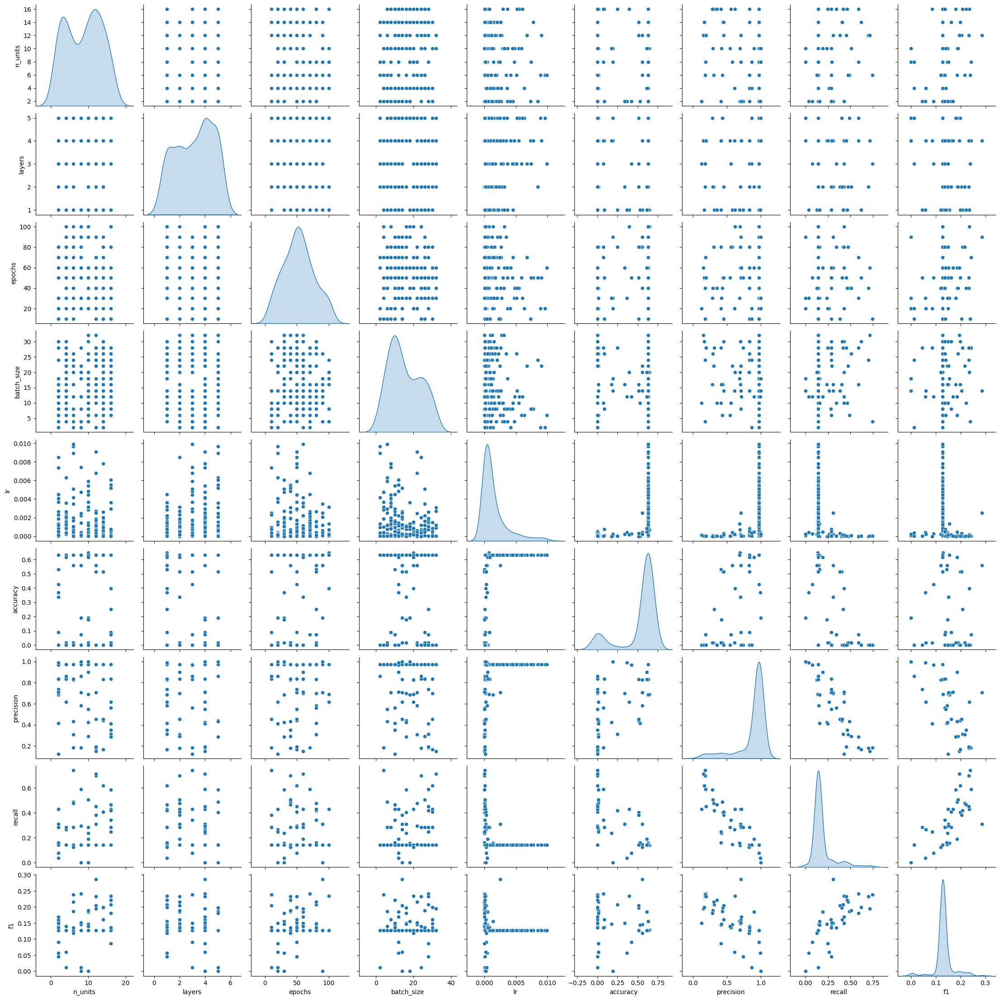

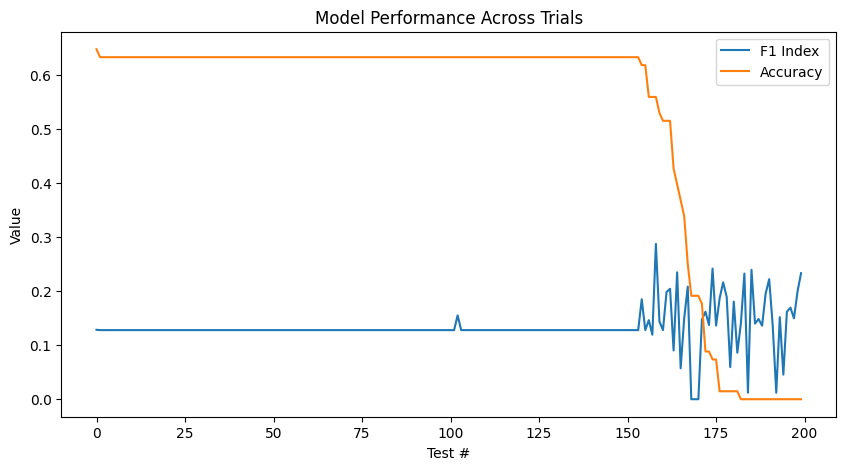

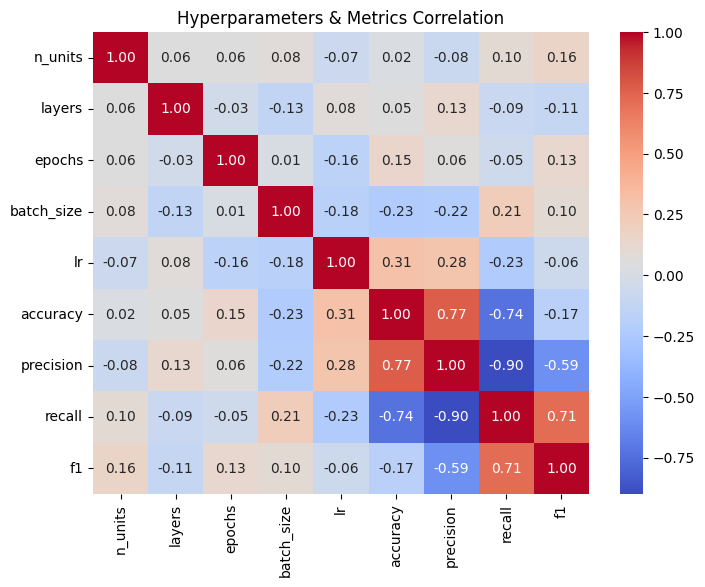

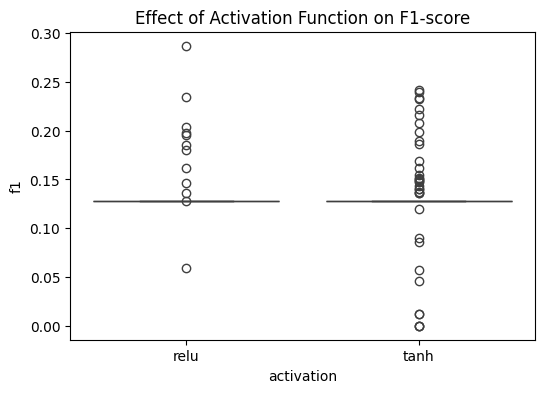

In [38]:
all_histories_s = all_histories.sort(key = lambda x: x['accuracy'], reverse=True)
df_hist = pd.DataFrame(all_histories)

sns.pairplot(df_hist, vars=["n_units", "layers", "epochs", "batch_size", "lr", "accuracy", "precision", "recall", "f1"], diag_kind="kde")
# plt.title("Hyperparameters and Metrics Pairplot")
plt.show()

plt.figure(figsize=(10, 5))
sns.lineplot(data=df_hist, x=df_hist.index, y="f1", label="F1 Index")
sns.lineplot(data=df_hist, x=df_hist.index, y="accuracy", label="Accuracy")
plt.xlabel("Test #")
plt.ylabel("Value")
plt.title("Model Performance Across Trials")
plt.legend()
plt.show()

df_histc = df_hist.select_dtypes(include=['number']) 
plt.figure(figsize=(8, 6))
sns.heatmap(df_histc.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Hyperparameters & Metrics Correlation")
plt.show()

plt.figure(figsize=(6, 4))
sns.boxplot(data=df_hist, x="activation", y="f1")
plt.title("Effect of Activation Function on F1-score")
plt.show()

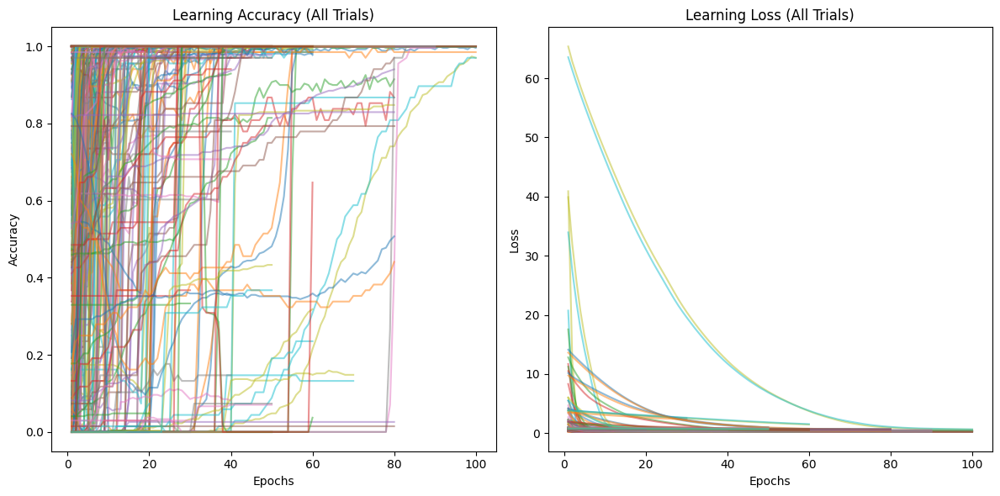

In [32]:
plt.figure(figsize=(12, 6))

for i, trial in enumerate(all_histories):
    history = trial["history"]
    epochs = range(1, len(history["accuracy"]) + 1)

    plt.subplot(1, 2, 1)
    sns.lineplot(x=epochs, y=history["accuracy"], label=f"Trial {i+1} Train", alpha=0.5)
    sns.lineplot(x=epochs, y=history["val_accuracy"], label=f"Trial {i+1} Val", alpha=0.5)

    plt.subplot(1, 2, 2)
    sns.lineplot(x=epochs, y=history["loss"], label=f"Trial {i+1} Train", alpha=0.5)
    sns.lineplot(x=epochs, y=history["val_loss"], label=f"Trial {i+1} Val", alpha=0.5)

plt.subplot(1, 2, 1)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Learning Accuracy (All Trials)")
plt.legend().set_visible(False)
# plt.legend(loc="lower right")

plt.subplot(1, 2, 2)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Learning Loss (All Trials)")
plt.legend().set_visible(False)
# plt.legend(loc="upper right")

plt.tight_layout()
plt.show()

In [ ]:
all_histories

[{'history': {'accuracy': [0.9407407641410828,
    0.9777777791023254,
    0.9518518447875977,
    0.9592592716217041,
    0.9481481313705444,
    0.9259259104728699,
    0.914814829826355,
    0.8740741014480591,
    0.855555534362793,
    0.8481481671333313,
    0.8444444537162781,
    0.8407407402992249,
    0.8259259462356567,
    0.8148148059844971,
    0.8888888955116272,
    0.9074074029922485,
    0.8888888955116272,
    0.885185182094574,
    0.885185182094574,
    0.8999999761581421,
    0.8999999761581421,
    0.9222221970558167,
    0.9111111164093018,
    0.9370370507240295,
    0.9259259104728699,
    0.9407407641410828,
    0.9370370507240295,
    0.9444444179534912,
    0.9666666388511658,
    0.9592592716217041,
    0.9629629850387573,
    0.9592592716217041,
    0.9814814925193787,
    0.9777777791023254,
    0.9777777791023254,
    0.9814814925193787,
    0.9851852059364319,
    0.9777777791023254,
    0.9851852059364319,
    0.9814814925193787,
    0.988888859748840